# Tratamiento de imágenes 2023 - Entregable 1

# Fecha de entrega: 12/04/2023

**Importante:** En todos los ejercicios se espera que se entregue comentarios sobre decisiones tomadas en la implementación así como un análisis de los resultados. Estos comentarios y análisis se pueden entregar en celdas de texto agregadas a los notebooks o en un informe aparte.

Para la entrega se sube un **zip** (no rar, ni otro formato) con:

-   El notebook del entregable modificado. El notebook debe tener las celdas ejecutadas con las salidas correspondientes. Debe tener todo lo necesario para poder ser ejecutado nuevamente
-   Todo el resto del contenido del zip del entregable. Si, para mostrar resultados, usan en el notebook imágenes propias, deben incluirlas en la carpeta **imagenes** del zip.
-   El informe en pdf en caso de no incluir las discusiones dentro del notebook en celdas "Markdown", o si les resulta más sencillo realizar el análisis en un documento aparte.

No se deben incluir en el zip de la entrega las imágenes de prueba que están disponibles en la página web del curso. Se asumirá que esas imágenes están en un directorio y se hará referencia a dichas imágenes en forma relativa a ese directorio (ver la celda siguiente).


In [1]:
import os
import numpy as np
from matplotlib import pyplot as plt
from skimage.io import imread, imsave

# FORMAS DE VER LAS GRAFICAS --------------------
# ELEGIR UNA DE LAS OPCIONES Y DES-COMENTAR (sacar # de la linea)
# ----------------
# a) graficas en línea  entre las celdas (no interactivo)
%matplotlib inline
# ----------------
# b) graficas en línea  entre las celdas (interactivo)
# %matplotlib notebook
# ----------------
# c) graficas en ventanas externas (abre una ventana por cada figura)
# %matplotlib
# ----------------
# d) Si se usa "jupyter lab" en lugar de "jupyter notebook" usar %matplotlib widget en lugar de %matplotlib notebook
# requiere instalar el modulo "ipympl". Ver https://stackoverflow.com/questions/51922480/javascript-error-ipython-is-not-defined-in-jupyterlab#56416229
# %matplotlib widget
# ---------------------------------------------------


# Directorio con la base de imágenes de prueba (las que están en la web de Timag)
# Ej. si usan la imagen trapo.jpg en el notebook no tienen que subirla al eva
# La llaman en el notebook en forma relativa a donde tengan esas imagenes:
#
# filename = os.path.join(dir_base_imagenes, 'trapo.jpg')
# I = imread(filename)
dir_base_imagenes = "../../imagenes/"  # uncompress before use
dir_zip_imagenes = "./imagenes/"  # uncompress before use

## 1) Líneas de nivel


Escribir un programa que reciba una imagen y un conjunto de valores y muestre las líneas de nivel correspondientes a dichos valores. Para ello implementar el algoritmo marching squares (Ver por ejemplo: https://en.wikipedia.org/wiki/Marching_squares).

Aplicarlo a imágenes naturales y artificiales y comparar los resultados con los de la función contour (https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.contour.html).

Imágenes artificiales sugeridas: cono.png, pliegues.png, oclusion.png


In [2]:
from matplotlib import collections as mc
from functools import lru_cache
import cv2

In [3]:
diagonal_left_bottom = (0.5, 0), (0, 0.5)
diagonal_bottom_right = (0.5, 0), (1, 0.5)
horizontal = (0, 0.5), (1, 0.5)
diagonal_top_right = (0.5, 1), (1, 0.5)
diagonal_left_top = (0, 0.5), (0.5, 1)
vertical = (0.5, 0), (0.5, 1)
look_up_table = [
    [],
    [diagonal_left_bottom],
    [diagonal_bottom_right],
    [horizontal],
    [diagonal_top_right],
    [diagonal_left_top, diagonal_bottom_right],
    [vertical],
    [diagonal_left_top],
    [diagonal_left_top],
    [vertical],
    [diagonal_left_bottom, diagonal_top_right],
    [diagonal_top_right],
    [horizontal],
    [diagonal_bottom_right],
    [diagonal_left_bottom],
    [],
]

Ejemplo : diagonal_left_bottom = (x1=(0.5, 0), x2=(0, 0.5))

<table>
  <tr>
    <td>(0,1)</td>
    <td></td>
    <td>(1,1)</td>
  </tr>
  <tr>
    <td>x2</td>
    <td></td>
    <td></td>
  </tr>
  <tr>
    <td>(0,0)</td>
    <td>x1</td>
    <td>(1,0)</td>
  </tr>
</table>


In [29]:
def contouring_grid_iterator(img):
    """Iterates over the pixels in the image generating cells of 2x2."""
    rows, cols = img.shape
    for j in range(0, cols - 1):
        for i in range(0, rows - 1):
            tl = img[i, j]
            tr = img[i, j + 1]
            br = img[i + 1, j + 1]
            bl = img[i + 1, j]
            yield (tl, tr, br, bl), (i, j)


@lru_cache(maxsize=16)
def compose_index(tl, tr, br, bl):
    """Compose the 4-bit binary index"""
    return (tl << 3) | (tr << 2) | (br << 1) | bl


def interpolate(segments, real_values):
    """Linear interpolation to adjust the line end-points"""
    tl, tr, br, bl = real_values
    interp_segments = []
    for segment in segments:
        interp_segment = []
        for point in segment:
            x, y = point

            # "Interpolacion"
            # el valor de la coord se ajusta proporcionalmente al valor de los pixeles
            # ejemplo : un punto en el borde izquierdo de la imagen (0, y) se ajusta a (0, 1 - bl/(bl+tl))
            # bl=30 y tl=90 entonces el punto se ajusta a (0, 1 - 30/120) = (0, 1-1/4=0.75)
            # bl=30 y br=90 entonces el punto se ajusta a (1-30/120, 0) = (0.75, 0)
            # tl=30 y tr=90 entonces el punto se ajusta a (1-30/120, 1) = (0.75, 1)
            # tr=30 y br=90 entonces el punto se ajusta a (1, 1-90/120) = (1, 0.25)
            if x == 0 and y < 1:  # Left edge
                weight = bl / (bl + tl)
                new_x = 0
                new_y = 1 - weight
            elif x == 1 and y < 1:  # Right edge
                weight = br / (tr + br)
                new_x = 1
                new_y = 1 - weight
            elif y == 0 and x < 1:  # Bottom edge
                weight = bl / (bl + br)
                new_x = 1 - weight
                new_y = 0
            elif y == 1 and x < 1:  # Top edge
                weight = tl / (tl + tr)
                new_x = 1 - weight
                new_y = 1
            else:
                new_x, new_y = x, y

            interp_segment.append((new_x, new_y))

        interp_segments.append(interp_segment)

    # interp_segments = [ [(),()], ... ] change to [ ((),()), ... ]
    interp_segments = [tuple(seg) for seg in interp_segments]
    return interp_segments


def marching_squares(img, level, interpolation):
    binary = np.where(img > level, 1, 0)

    contours = []
    for binary_values, (x, y) in contouring_grid_iterator(binary):
        case_index = compose_index(*binary_values)
        segments = look_up_table[case_index]

        if interpolation:
            segments = interpolate(
                segments, (img[x, y], img[x, y + 1], img[x + 1, y + 1], img[x + 1, y])
            )

        # ajuste de las coordenadas
        # el indice de la columna corresponde al eje x y el de la fila al eje y
        # por eso x=y+dx siendo dx el desplazamiento en el eje x.
        # y=-dy+x es analogo a excepcion del menos que viene por como se recorre la matriz
        # (de arriba a abajo, opuesto a como se mide en el eje y)
        tmp = [(dx + y, -dy + x) for segment in segments for dx, dy in segment]
        if tmp:
            contours.append(tmp)

    return contours


def lineas_nivel(img, levels, subplot=None, interpolate=True):
    """Muestra las líneas de nivel."""
    # permite pasarle un subplot
    fig, ax = plt.subplots() if subplot is None else subplot
    colors = plt.cm.jet(np.linspace(0, 1, len(levels)))

    # evita que ocurra overflow en la interpolacion
    img = img.astype(np.uint16)

    for level, color in zip(levels, colors):
        level_contours = marching_squares(img, level, interpolation=interpolate)
        ax.add_collection(mc.LineCollection(level_contours, color=color, linewidths=1))

    ax.set_aspect("equal")
    ax.margins(0)
    ax.grid()
    ax.invert_yaxis()

    # agregar padding
    padding_percent = 0.015  # agrega un 1.5% de padding
    x_padding = (ax.get_xlim()[1] - ax.get_xlim()[0]) * padding_percent
    y_padding = (ax.get_ylim()[1] - ax.get_ylim()[0]) * padding_percent
    ax.set_xlim(ax.get_xlim()[0] - x_padding, ax.get_xlim()[1] + x_padding)
    ax.set_ylim(ax.get_ylim()[0] - y_padding, ax.get_ylim()[1] + y_padding)

    if subplot is None:
        plt.show()

In [222]:
# Test para interpolate:
real_values = (90, 150, 25, 30)
segment = [diagonal_left_bottom, diagonal_top_right]
print(interpolate(segment, real_values))

[((0.4545454545454546, 0), (0, 0.75)), ((0.625, 1), (1, 0.8571428571428572))]


In [5]:
# Artifciales
wally = imread(os.path.join(dir_zip_imagenes, "Wally_template.png"))
pliegues = imread(os.path.join(dir_zip_imagenes, "pliegues.png"))

# Naturales
# use cv2 para leer las imagenes en blanco y negro porque imread las normaliza y eso  me daba problemas con las divisiones de la funcion interpolate
edificio = cv2.imread(
    os.path.join(dir_base_imagenes, "edificio.jpg"), cv2.IMREAD_GRAYSCALE
)
baboon = cv2.imread(os.path.join(dir_base_imagenes, "baboon.png"), cv2.IMREAD_GRAYSCALE)

In [21]:
def compare_contours(img, levels):
    fig, ax = plt.subplots(1, 3, figsize=(10, 5), sharex=True, sharey=True)

    ax[0].contour(img, levels)
    ax[0].invert_yaxis()
    ax[0].set_aspect("equal")
    ax[0].grid()
    ax[0].set_title("Contour")

    lineas_nivel(img, levels, (fig, ax[1]), interpolate=False)
    ax[1].set_title("Marching Squares (Without Interpolation)", fontsize=9)
    lineas_nivel(img, levels, (fig, ax[2]), interpolate=True)
    ax[2].set_title("Marching Squares (With Interpolation)", fontsize=9)

    # Add padding relative to plot size
    padding_percent = 0.015  # agrega un 1.5% de padding
    x_padding = (ax[0].get_xlim()[1] - ax[0].get_xlim()[0]) * padding_percent
    y_padding = (ax[0].get_ylim()[1] - ax[0].get_ylim()[0]) * padding_percent
    ax[0].set_xlim(ax[0].get_xlim()[0] - x_padding, ax[0].get_xlim()[1] + x_padding)
    ax[0].set_ylim(ax[0].get_ylim()[0] - y_padding, ax[0].get_ylim()[1] + y_padding)

    plt.show()

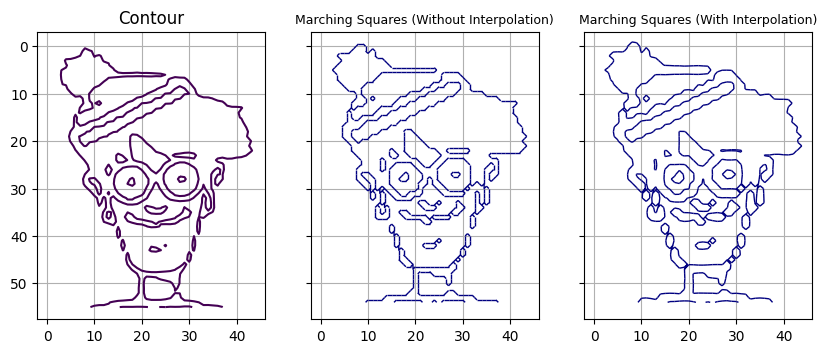

In [30]:
compare_contours(wally, [100])

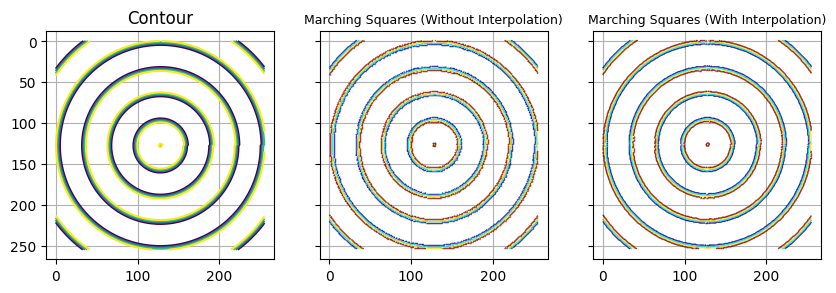

In [23]:
compare_contours(pliegues, [100, 120, 140, 160])

Acá se llega a apreciar la mejora que ofrece la interpolación


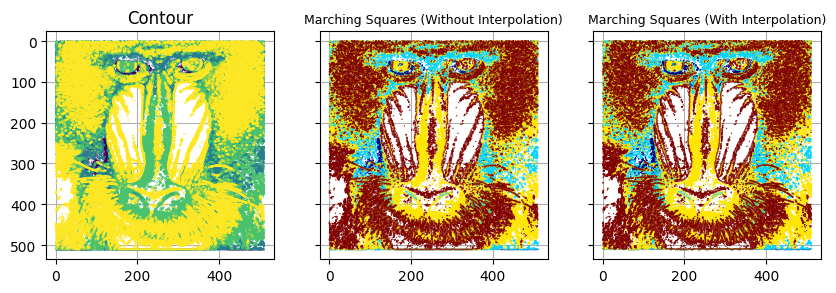

In [24]:
compare_contours(baboon, [20, 80, 120, 160])

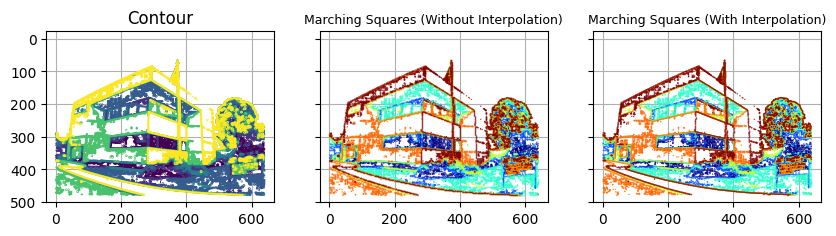

In [25]:
compare_contours(edificio, [20, 40, 60, 80, 120, 160])

En la primera imagen (wally) se observa como las curvas dibujadas por la función $contour$ se ven mas _suaves_, esto probablemente se deba a la utilización de una diferente función de interpolación.

En las imágenes artificiales esta diferencia es más evidente. En las naturales las texturas hacen que las curvas de nivel parezcan dibujos punteados (ver imagen baboon), además las zonas cercanas tienen píxeles de color similar entonces se forman "manchas" o líneas gruesas que esconden la diferencia. Por el contrario las imágenes artificiales tienen bordes más definidos y podemos apreciar bien las diferencias.


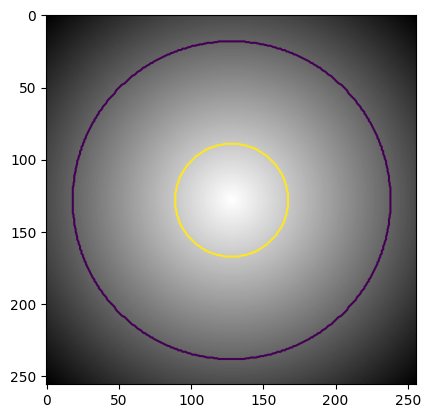

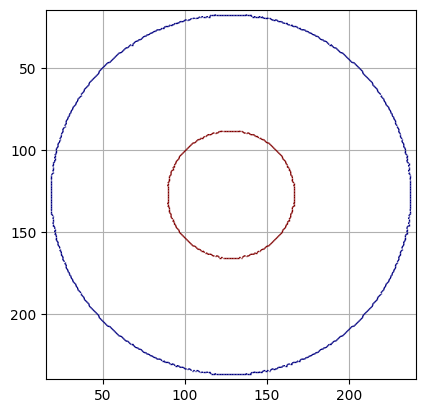

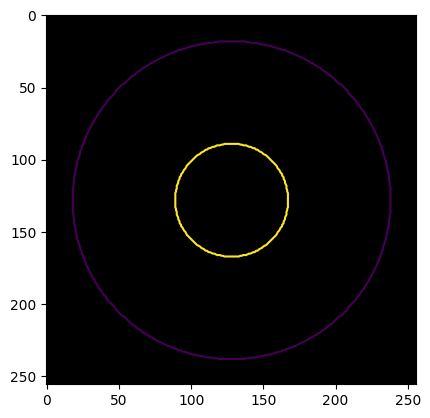

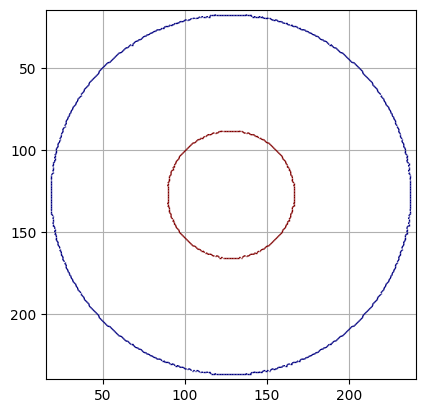

In [35]:
# Ejemplo de prueba: lineas_nivel y plt.contour deberían ser intercambiables
I = imread("imagenes/cono.png")
if I.ndim > 2:
    I = I[:, :, 0]

# muestra las líneas de nivel 100 y 200 sobre la imagen seleccionada
plt.figure()
plt.imshow(I, cmap="gray")
plt.contour(I, levels=[100, 200])
lineas_nivel(I, levels=[100, 200])

# muestra las líneas de nivel 100 y 200 sobre una imagen vacía
plt.figure()
plt.imshow(np.zeros_like(I), cmap="gray")
plt.contour(I, levels=[100, 200])
lineas_nivel(I, levels=[100, 200])

## 2) Histograma

Imágenes sugeridas: parot1.png, parot2.png, strike1.png, strike2.png


**a)** Implementar una función que calcule el histograma e histograma acumulado de una imagen. Mostrar resultados para las imágenes parot1.png y parot2.png con diverso número de bins (bins=10, bins=100, bins=256).


In [3]:
parot1 = imread(os.path.join(dir_base_imagenes, "parot1.png"))
parot2 = imread(os.path.join(dir_base_imagenes, "parot2.png"))
strike1 = imread(os.path.join(dir_base_imagenes, "strike1.png"))
strike2 = imread(os.path.join(dir_base_imagenes, "strike2.png"))

In [40]:
def histograma(img, bins, rango=None):
    """
    Calcula el histograma de una imagen.
    Devuelve el histograma y los bins correspondientes.

    Args:
        imagen (ndarray): La imagen de entrada.
        bins (int): El número de bins a utilizar.
        range (float, float), opcional. Rango mínimo y máximo para los bins. Si no
                                        se pasa, se toma el mínimo y máximo de la imagen

    Returns:
        counts (1D-array de largo bins): Cantidad de muestras en cada bin
        bin_edges (1D-array de largo bins +1): Los bordes de los bins utilizados para calcular el histograma.
    """
    if rango is None:
        rango = (img.min(), img.max())

    # Calculate the bin width and create an empty histogram array
    bin_width = (rango[1] - rango[0]) / bins
    counts = np.zeros(bins)

    # contamos la cantidad de pixeles en cada bin
    for pixel in img.flat:
        # indice del bin correspondiente al valor del pixel
        bin_idx = int((pixel - rango[0]) // bin_width)
        if 0 <= bin_idx < bins:
            counts[bin_idx] += 1
        # obs: como int(255//(255/256))=256 lo acomodamos al ultimo bin (el de indice 255). ademas int(254//(255/256))=254
        elif bin_idx == bins:
            counts[bin_idx - 1] += 1
        else:
            print(
                f"Pixel {pixel} is outside the range [{rango[0]}, {rango[1]}] with {bin_idx}"
            )

    # calculo de los limites de los bins
    bin_edges = np.linspace(rango[0], rango[1], bins + 1)
    return counts, bin_edges


def histogramaAcumulado(img, bins, range=None):
    """
    Calcula el histograma acumulado de una imagen.
    Devuelve el histograma acumulado y los bins correspondientes.

    Args:
        imagen (ndarray): La imagen de entrada.
        bins (int): El número de bins a utilizar.
        range (float, float), opcional. Rango mínimo y máximo para los bins. Si no
                                        se pasa, se toma el mínimo y máximo de la imagen

    Returns:
        counts (1D-array de largo bins): Cantidad de muestras acumuladas en cada bin
        bin_edges (1D-array de largo bins +1): Los bordes de los bins utilizados.
    """
    hist, bin_edges = histograma(img, bins, range)
    counts = np.zeros(bins)
    counts[0] = hist[0]
    # formula : CDF(x) = P(x<=X) = sumatoria de P(x<=X) para x en [0, X]
    # entonces el valor del bin i es la suma de P(x=X)=hist(x) + CDF(x-1) con CDF(0) = hist(0)
    for i in np.arange(0, bins):
        counts[i] = counts[i - 1] + hist[i]

    return counts, bin_edges

### Chequeo histograma y histogramaAcumulado contra libreria


In [277]:
img = parot1

bins = 25
img_range = (img.min(), img.max())
counts1, _ = histograma(img, bins, range=img_range)
counts2, _ = np.histogram(img.ravel(), bins=bins, range=img_range)

ccounts1, _ = histogramaAcumulado(img, bins, range=img_range)
ccounts2 = np.cumsum(counts1)

# Chequeo
print("Histogram Comparison", np.array_equal(counts1, counts2))
print("Cumulative Histogram Comparison", np.array_equal(ccounts1, ccounts2))

Histogram Comparison True
Cumulative Histogram Comparison True


**b)** Comparar los histogramas con la salida de la función _histogram()_ de numpy para las mismas imágenes y mismos bins.


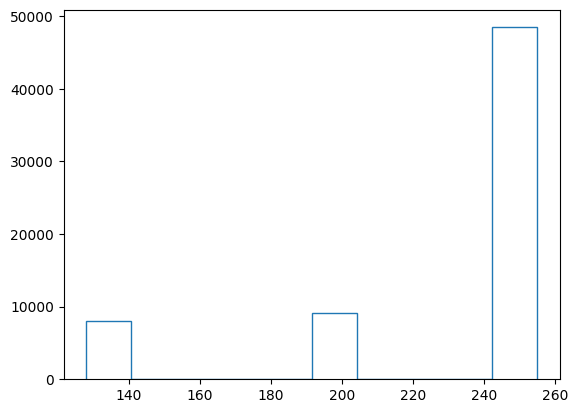

In [5]:
# Ejemplo de prueba: histograma y np.histogram deberían ser intercambiables

I = imread("imagenes/oclusion.bmp")
if I.ndim > 2:
    I = I[:, :, 0]

# # calcula y muestra el histograma
counts, bin_edges = np.histogram(I.flatten(), 10)
counts, bin_edges = histograma(I.flatten(), 10)

plt.figure()
plt.stairs(counts, bin_edges)  # u otra forma de graficar

# #-----------------------------------------

# calcula y muestra el histograma
# counts, bin_edges = np.histogram(I.flatten(), 10, (0,255))
# counts, bin_edges = histograma(I.flatten(), 10, (0,255))

# plt.figure()
# plt.stairs(counts, bin_edges) #u otra forma de graficar

# #-----------------------------------------

# # calcula y muestra el histograma
# counts, bin_edges = np.histogram(I.flatten(), 256, (0,255))
# counts, bin_edges = histograma(I.flatten(), 256, (0,255))

# plt.figure()
# plt.stairs(counts, bin_edges) #u otra forma de graficar

**c)** Calcular el histograma de la imagen ct_dcm.tif (imagen de 16 bits).

Desplegar la imagen

Buscar información sobre **ventana/nivel** (_Window/Level_) y explicar por qué tiene sentido usar este mecanismo para visualizar imágenes de tomografía computada.


In [37]:
ct_cdm = imread(os.path.join(dir_zip_imagenes, "ct_dcm.tif"))

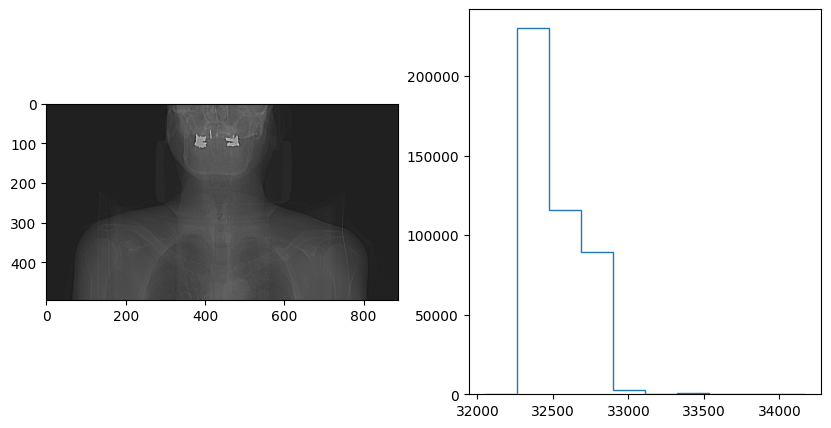

In [12]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(ct_cdm, cmap="gray")

counts, bins = np.histogram(ct_cdm.ravel())
ax[1].stairs(counts, bins)

La ventana/nivel (Window/Level) es un mecanismo o tecnica de ajuste para la visualizacion de imágenes, este ajuste busca maximizar el contraste mediante un función lineal que es aplicada a todos los píxeles.

La **ventana** se refiere al **rango de valores de intensidad** de píxeles que se mostrarán en la imagen, mientras que el **nivel** se refiere al **valor de intensidad que se asigna al punto medio** de la ventana.

En las imágenes de tomografías computarizadas los valores de intensidad de los píxeles pueden variar ampliamente, desde el aire (valores bajos) hasta los huesos (valores altos). Esta gran variación en los valores de intensidad puede dificultar la visualización de detalles relevantes.

Utilizando esta técnica se puede, por ejemplo, visualizar los detalles de los tejidos blandos si ajustamos la ventana para mostrar valores de intensidad de píxeles bajos y asignar un nivel que resalte estos tejidos.

Todo esto permite mejorar la interpretación de la imagen, lo cual es esencial para que los médicos puedan realizar buenos diagnósticos y es por lo cual se utiliza dicha técnica en este tipo de imágenes.


http://what-when-how.com/embedded-image-processing-on-the-tms320c6000-dsp/windowlevel-image-processing-part-1/
http://fisica.ciens.ucv.ve/curs/dipcourse/html/one-oper/window-level/front-page.html


**d)** Implementar una función que realice el matching de histogramas entre un par de imágenes.

(Ver por ejemplo: http://paulbourke.net/miscellaneous/equalisation/ y https://en.wikipedia.org/wiki/Histogram_matching )

(Artículo interesante que hace algo levemente diferente a lo que se pide en este ejercicio: https://www.ipol.im/pub/art/2016/140/)


In [4]:
## Devuelve una imagen, la cual corresponde a ajustar el histograma de img al histograma de la imagen de referencia img_base
def matching(img, img_base):
    """
    Matching de histograma de una imagen con una imagen de referencia.

    Args:
        img (ndarray): La imagen de entrada.
        img_base (ndarray): La imagen de referencia.

    Returns:
        img_match (ndarray): La imagen con el histograma matcheado al de referencia

    """
    # we calculate the cumulative distribution functions of the two images histograms
    histI, _ = histogramaAcumulado(img, 256)
    histExpected, _ = histogramaAcumulado(img_base, 256)

    # For each gray level G1
    lut = np.zeros(256, dtype=np.uint8)
    for i in range(256):
        j = 0
        # Find the closest gray level G2 in the reference histogram
        # we find gray level G2 such that F1(G1) ~ F2(G2)
        while histI[i] > histExpected[j]:
            j += 1
        lut[i] = j

    # M(G1) ~ G2
    img_match = lut[img]

    return img_match

https://en.wikipedia.org/wiki/Histogram_matching


**e)** Aplique el matching de histogramas entre dos imágenes (por ejemplo entre parot1.png y parot2.png y/o entre strike1.png y strike2.png).

Muestre y analice los resultados.


In [42]:
titles_parot = ["Parot 1", "Parot 2", "Parot 1 matcheada a 2", "Parot 2 matcheada a 1"]
images_parot = [parot1, parot2, matching(parot1, parot2), matching(parot2, parot1)]
hists_parot = [histograma(img, 256) for img in images_parot]

In [43]:
titles_strike = [
    "strike 1",
    "strike 2",
    "strike 1 matcheada a 2",
    "strike 2 matcheada a 1",
]
images_strike = [
    strike1,
    strike2,
    matching(strike1, strike2),
    matching(strike2, strike1),
]
hists_strike = [histograma(img, 256) for img in images_strike]

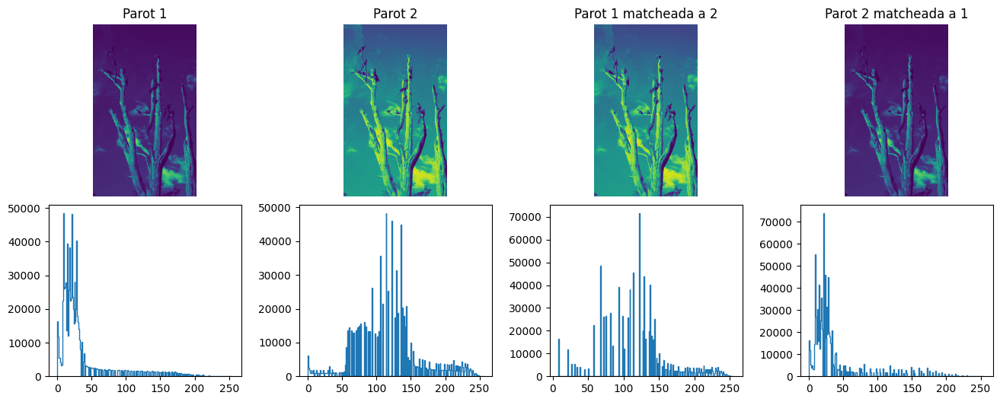

In [46]:
fig, axs = plt.subplots(2, 4, figsize=(16, 6))
for ax_img, ax_hist, title, image, hist in zip(
    axs[0], axs[1], titles_parot, images_parot, hists_parot
):
    ax_img.set_title(title)
    ax_img.set_axis_off()
    ax_img.imshow(image)
    ax_hist.stairs(*hist)

plt.subplots_adjust(wspace=0.3, hspace=0.05)
plt.show()

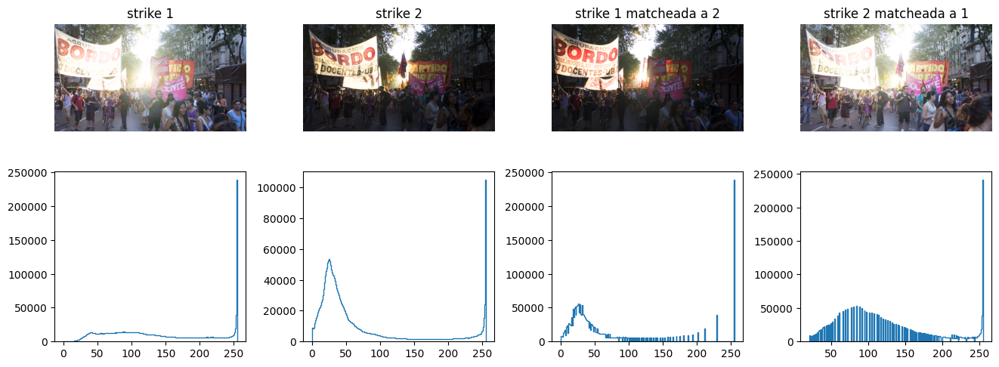

In [47]:
fig, axs = plt.subplots(2, 4, figsize=(16, 6))
for ax_img, ax_hist, title, image, hist in zip(
    axs[0], axs[1], titles_strike, images_strike, hists_strike
):
    ax_img.set_title(title)
    ax_img.set_axis_off()
    ax_img.imshow(image)
    ax_hist.stairs(*hist)

plt.subplots_adjust(wspace=0.3, hspace=0.05)
plt.show()

Usando como ejemplo parot1.png y parot2.png, se puede observar que la imagen resultante de ajustar el histograma de la primera al de la segunda muestra una imagen con mayor iluminación, con una apariencia más similar a la imagen de referencia (parot2.png). Por otro lado, cuando se ajusta el histograma de parot2.png al de parot1.png ocurre lo opuesto, se obtiene una imagen con una apariencia más oscura.

En ambos casos, se puede apreciar cómo el matching de histogramas puede ser utilizado para **mejorar el contraste y la iluminación** en una imagen, ajustando su apariencia a la de una **imagen de referencia que cumpla con ciertas caracteristicas de interés**. La técnica se basa en la idea de que si dos imágenes tienen histogramas similares, es más probable que se perciban de manera similar por el ojo humano.


### Chequeo histogram_matching contra libreria


In [48]:
from skimage import exposure

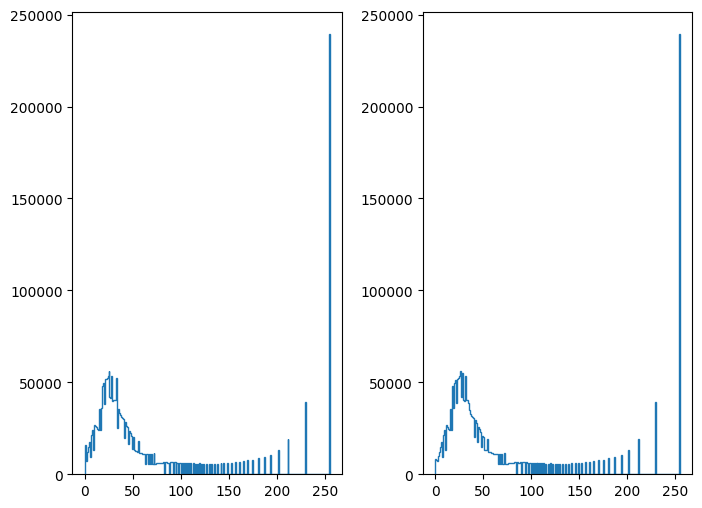

In [51]:
fig, ax = plt.subplots(1, 2, figsize=(8, 6))
plt.subplots_adjust(wspace=0.3)
ax[1].stairs(*hists_strike[2])
ax[0].stairs(*np.histogram(exposure.match_histograms(strike1, strike2), 256))

## 3) Restauración de imágenes con ruido


**a) A partir de una imagen original, generar imágenes con diferentes niveles de ruido gaussiano (por ejemplo σ=5, 10, 20, 40) y ruido “sal y pimienta” (por ejemplo p=0.1, 0.3, 0.5, 0.8).**

Imágenes sugeridas: lena.bmp, peppers.png, baboon.png, (pasadas a gris en caso que estén en colores)  
Otras [imágenes estándar](http://en.wikipedia.org/wiki/Standard_test_image) se pueden encontrar en http://sipi.usc.edu/database/database.php?volume=misc


In [15]:
lena = imread(os.path.join(dir_base_imagenes, "lena.bmp"), as_gray=True)
# peppers = imread(os.path.join(dir_base_imagenes, 'peppers.png'), as_gray=True)
# baboon = imread(os.path.join(dir_base_imagenes, 'baboon.png'), as_gray=True)

img_to_be_noised = lena

In [40]:
def add_gaussian_noise(I, sigma):
    """
    Contaminar imagen con ruido Gaussiano de desviación estándar sigma.

    Args:
        I (ndarray): La imagen de entrada.
        sigma (float): Desviación estándar del ruido.

    Returns:
        J (ndarray): La imagen contaminada con ruido Gaussiano de desviación estándar sigma

    """
    # creamos un vector de ruido gaussiano
    noise = np.random.normal(0, sigma, I.shape)
    # agregamos el ruido a la imagen sumando entrada a entrada y nos aaseguramos que los valores estén en el rango [0, 255]
    J = np.clip(I + noise, 0, 255).astype(np.uint8)

    return J


def add_saltpepper_noise(I, p):
    """
    Contaminar imagen con ruido sal y pimienta. Cada pixel tiene probabilidad p de ser contaminado.
    Se asume que, dado un pixel contaminado, la asignación de 0 o 255 (pepper y salt, respectivamente) es equiprobale.

    Args:
        I (ndarray): La imagen de entrada.
        p (float): Probabilidad de que un pixel sea contaminado.

    Returns:
        J (ndarray): La imagen contaminada con ruido sal y pimienta

    """

    random_prob = np.random.rand(I.shape[0], I.shape[1])
    J = I.copy()

    # Aplica ruido sal y pimienta
    # (p / 2) asegura que los valores de prob, sean simétricos alrededor de 0.5, lo que resulta en aprox la misma cantidad de ruido "sal" y "pimienta"
    J[random_prob < p / 2] = 0  # ruido pimienta
    J[random_prob > 1 - p / 2] = 255  # ruido sal
    J = J.astype(np.uint8)

    return J

In [7]:
from dataclasses import dataclass


@dataclass
class Image:
    image: np.ndarray

    noise: str = "none"
    # si noise == 'gaussian', entonces param=sigma, si noise == 's&p', entonces param=p
    param: int = None

    filter: str = "none"
    ksize: int = None

In [17]:
sigmas = [0, 5, 10, 20, 40]
saltpepper_p = [0, 0.1, 0.3, 0.5, 0.8]

noisy_images = []
for sigma in sigmas:
    noisy_images.append(
        Image(
            image=add_gaussian_noise(img_to_be_noised, sigma),
            noise="gaussian",
            param=sigma,
        )
    )
for p in saltpepper_p:
    noisy_images.append(
        Image(image=add_saltpepper_noise(img_to_be_noised, p), noise="s&p", param=p)
    )

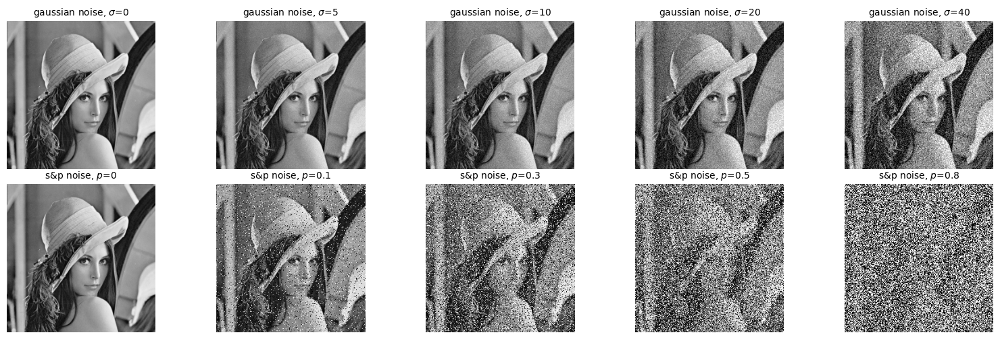

In [18]:
fig, axs = plt.subplots(2, 5, figsize=(20, 6), sharex=True, sharey=True)

for ax, img in zip(axs.flat, noisy_images):
    ax.set_axis_off()
    ax.imshow(img.image, cmap="gray")

    param_name = r"$\sigma$" if img.noise == "gaussian" else r"$p$"
    ax.set_title(f"{img.noise} noise, {param_name}={img.param}", fontsize=10)

plt.subplots_adjust(wspace=0, hspace=0.1)
plt.show()

**b) Procesar las imágenes de (a) con**

-   filtros de media de diverso tamaño (implementar)
-   filtros de mediana de diverso tamaño (implementar)
-   Non local means (usar implementación de OpenCV y/o de scikit-image)


In [22]:
import cv2

In [48]:
def apply_filter_func(I, ksize, filter_func):
    filtered = np.zeros_like(I)
    padded_img = np.pad(I, ksize // 2, mode="edge")

    for r in range(I.shape[0]):
        for c in range(I.shape[1]):
            filtered[r, c] = filter_func(
                padded_img[r : r + ksize + 1, c : c + ksize + 1]
            )

    return filtered


def mean_filtered(I, ksize):
    return apply_filter_func(I, ksize, np.mean)


def median_filtered(I, ksize):
    return apply_filter_func(I, ksize, np.median)


def non_local_mean_filtered(I):
    """open cv implementation"""
    # los parametros usados son los recomendados en el siguiente link
    # https://www.javatpoint.com/fastnlmeansdenoising-in-python
    return cv2.fastNlMeansDenoising(
        I, None, templateWindowSize=15, searchWindowSize=10, h=21
    )

In [20]:
kernel_sizes = [3, 4, 5]  # [k for k in range(3, 12, 1)]

In [49]:
# este bloque demora como uno o dos minutos
filtered_images = []
for img in noisy_images:
    for ksize in kernel_sizes:
        filtered_images.append(
            Image(
                image=median_filtered(img.image, ksize),
                noise=img.noise,
                param=img.param,
                filter="median",
                ksize=ksize,
            )
        )
        filtered_images.append(
            Image(
                image=mean_filtered(img.image, ksize),
                noise=img.noise,
                param=img.param,
                filter="mean",
                ksize=ksize,
            )
        )
    filtered_images.append(
        Image(
            image=non_local_mean_filtered(img.image),
            noise=img.noise,
            param=img.param,
            filter="non_local_mean",
        )
    )

In [23]:
# opcion con multiprocesamiento, ligeramente mas rapida que el bloque anterior
from concurrent.futures import ProcessPoolExecutor


def apply_mean(img, ksize):
    return Image(
        image=mean_filtered(img.image, ksize),
        noise=img.noise,
        param=img.param,
        filter="mean",
        ksize=ksize,
    )


def apply_median(img, ksize):
    return Image(
        image=median_filtered(img.image, ksize),
        noise=img.noise,
        param=img.param,
        filter="median",
        ksize=ksize,
    )


def apply_nl(img):
    return Image(
        image=non_local_mean_filtered(img.image),
        noise=img.noise,
        param=img.param,
        filter="non_local_mean",
    )


filtered_images = []
with ProcessPoolExecutor() as executor:
    for img in noisy_images:
        for ksize in kernel_sizes:
            filtered_images.append(executor.submit(apply_mean, img, ksize))
            filtered_images.append(executor.submit(apply_median, img, ksize))
    filtered_images.extend([executor.submit(apply_nl, img) for img in noisy_images])

filtered_images = [f.result() for f in filtered_images]

**c) Cuantificar la reducción de ruido utilizando medidas adecuadas (PSNR, RMSE).**  
Indicar cuáles de los algoritmos son adecuados para cada tipo de ruido.

Las métricas a usar pueden encontrarse en [skimage.metrics ](https://scikit-image.org/docs/stable/api/skimage.metrics.html)


**Nota:** En caso que lo deseen, la parte de cuantificación puede realizarse en Fiji mediante el plugin SNR como se muestra en el video de Restauración.  
Para eso, se puede guardar las imágenes originales, ruidosas y restauradas generadas en el notebook y luego procesarlas con Fiji.  
El plugin se encuentra disponible en http://bigwww.epfl.ch/sage/soft/snr/.
También se encuentra como ejemplo el macro _Macro_noise.ijm_ para generar las imagenes ruidosas y la restauración.

Si se sigue este último camino, comparar con el resultado de skimage.metrics para alguna restauración hecha.


In [24]:
from skimage.metrics import peak_signal_noise_ratio, mean_squared_error
import pandas as pd

In [31]:
noisy_images_df = pd.DataFrame(noisy_images)
filtered_images_df = pd.DataFrame(filtered_images)

In [ ]:
def calculate_metrics(row):
    # obtenemos la imagen previa a ser filtrada, para luego calcular la mejora
    img_before_filtering = noisy_images_df[
        (noisy_images_df["noise"] == row["noise"])
        & (noisy_images_df["param"] == row["param"])
    ].image.values[0]

    # metricas previo al filtrado
    noisy_psnr = peak_signal_noise_ratio(img_to_be_noised, img_before_filtering)
    noisy_mse = mean_squared_error(img_to_be_noised, img_before_filtering)
    # metricas luego del filtrado
    filtered_psnr = peak_signal_noise_ratio(img_to_be_noised, row.image)
    filtered_mse = mean_squared_error(img_to_be_noised, row.image)

    # con el if chequeamos si le estamos calculando el error a la imagen original (sin ruido)
    # essto evita divsiones entre 0 ademas de que estos resultados no son de interes
    mse_improvement = (
        (noisy_mse - filtered_mse) / noisy_mse * 100 if noisy_mse != 0 else 0
    )
    psnr_improvement = (
        (filtered_psnr - noisy_psnr) / noisy_psnr * 100 if noisy_psnr != 0 else 0
    )

    return [
        row["noise"],
        row["param"],
        row["filter"],
        row["ksize"],
        noisy_psnr,
        filtered_psnr,
        noisy_mse,
        filtered_mse,
        psnr_improvement,
        mse_improvement,
    ]


metrics = filtered_images_df.apply(calculate_metrics, axis=1, result_type="expand")
metrics.columns = [
    "noise",
    "param",
    "filter",
    "ksize",
    "psnr",
    "filtered_psnr",
    "mse",
    "filtered_mse",
    "psnr_improv_perc",
    "mse_improv_perc",
]

# descarto las filas con param=0 porque corresponden a aplicar los filtros sobre la imagen original (sin ruido)
# lo cual no tiene sentido para este analisis
metrics = metrics.loc[metrics["param"] != 0].reset_index(drop=True)

In [51]:
metrics

,noise,param,filter,ksize,psnr,filtered_psnr,mse,filtered_mse,psnr_improv_perc,mse_improv_perc
0,gaussian,5.0,median,3.0,34.117422,25.781492,25.196381,171.763596,-24.433058,-581.699480
1,gaussian,5.0,mean,3.0,34.117422,25.499207,25.196381,183.298798,-25.260451,-627.480666
2,gaussian,5.0,median,4.0,34.117422,27.342669,25.196381,119.898422,-19.857166,-375.855735
3,gaussian,5.0,mean,4.0,34.117422,25.393514,25.196381,187.814423,-25.570243,-645.402387
4,gaussian,5.0,median,5.0,34.117422,24.744897,25.196381,218.067352,-27.471375,-765.470941
5,gaussian,5.0,mean,5.0,34.117422,23.864622,25.196381,267.065750,-30.051510,-959.936958
6,gaussian,5.0,non_local_mean,NaN,34.117422,31.097437,25.196381,50.505264,-8.851738,-100.446505
7,gaussian,10.0,median,3.0,28.111333,25.629972,100.449341,177.862000,-8.826906,-77.066368
8,gaussian,10.0,mean,3.0,28.111333,25.387901,100.449341,188.057312,-9.688019,-87.216074
9,gaussian,10.0,median,4.0,28.111333,26.997758,100.449341,129.808929,-3.961302,-29.228254


Observaciones:

-   Para ruido $gaussiano$ de $\sigma=5$ el **desempeño de los 3 filtros es bastante malo**, si bien el filtro de mediana obtiene mejores resultados que el de media y el non local mean mejores que los otros dos, todos empeoran la imagen respecto a las dos métricas analizadas.

-   Para ruido $gaussiano$ de $\sigma=10$ la historia es similar, tanto el filtro de media como el de mediana empeoran la calidad de la imagen en ambas métricas existiendo un leve mejor comportamiento del filtro mediana, por otro lado **el filtro nlm sí consigue mejorar la imagen**.

-   Para ruido $gaussiano$ de $\sigma=20$ ya el ruido en la imagen es suficiente como para que **todos los filtros logren una mejora en la calidad** de la misma. El filtro nlm sigue siendo el que mejor se comporta.

-   Para ruido $gaussiano$ de $\sigma=40$, aquí ocurre algo curioso, el filtro nlm logra resultados muy inferiores a los otros dos. Además vemos como el filtro de media se comporta mejor que el de mediana para el kernel de tamaño 3, en tamaño 4 se igualan y en tamaño 5 el de mediana consigue un resultado ligeramente superior.

Para el ruido $sal\;y\;pimienta$ los resultados son más claros, **en todos los casos los filtros mejoraron la calidad de la imagen en ambas métricas**, la mejora es sustancial para los filtros de media y mediana y casi inexistente para el nlm. En particular **el filtro de mediana logra resultados claramente mejores**, y este destaca especialmente con un kernel de tamaño 4.

Esto último muestra la importancia de este factor puesto que un tamaño muy chico no permitiría una buena estimación de la media y uno muy grande provocaría una pérdida innecesaria de detalles.

Una curiosidad es que para el ruido $sal\;y\;pimienta$ con $p=0.8$ es el filtro de media el que supera al de mediana, quizás producto de la combinación entre la gran cantidad de ruido presente en la imagen y no haber experimentado con tamaños de kernel suficientemente grandes.

En general los resultados son razonables.

Puesto que la mediana es el valor central en un conjunto de datos ordenados esta no se ve afectada por valores extremos o atípicos, lo que la hace robusta frente a la presencia de ruido impulsivo como el sal y pimienta el filtro capturará un conjunto de píxeles ruidosos como no ruidosos. Al calcular la mediana de estos valores, los píxeles ruidosos, que son valores atípicos, no se tomarán en cuenta suavizando la imagen y eliminando el ruido sin afectar en gran medida los detalles y características importantes de la imagen.

Por otro lado, el ruido gaussiano es un tipo de ruido que se distribuye normalmente en la imagen, lo que significa que los valores de los píxeles ruidosos se distribuyen en forma de campana alrededor de un valor medio. El filtro de media es especialmente efectivo en la reducción del ruido gaussiano porque aprovecha esta propiedad estadística del ruido.


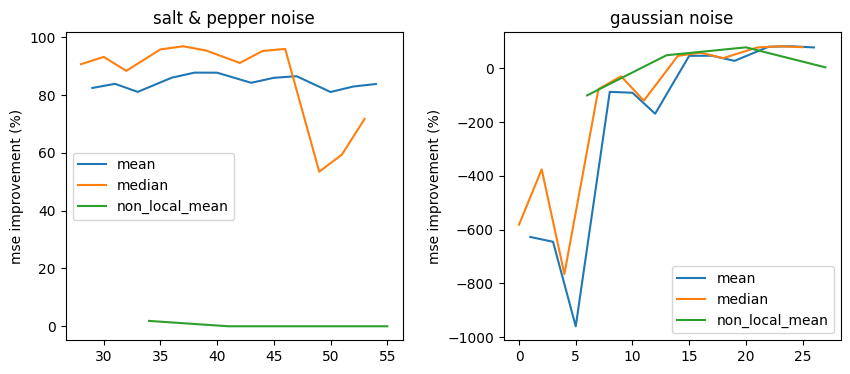

In [38]:
grouped_sp_mse = metrics[(metrics["noise"] == "s&p")].groupby("filter")[
    "mse_improv_perc"
]
grouped_g_mse = metrics[(metrics["noise"] == "gaussian")].groupby("filter")[
    "mse_improv_perc"
]

fig, ax = plt.subplots(1, 2, figsize=(10, 4))

for (sp_name, sp_group), (g_name, g_group) in zip(grouped_sp_mse, grouped_g_mse):
    ax[0].plot(sp_group, label=sp_name)
    ax[1].plot(g_group, label=g_name)
ax[0].legend()
ax[0].set_ylabel("mse improvement (%)")
ax[0].set_title("salt & pepper noise")
ax[1].legend()
ax[1].set_ylabel("mse improvement (%)")
ax[1].set_title("gaussian noise")

plt.subplots_adjust(wspace=0.3)
plt.show()

**Para el ruido s&p el filtro de mediana parece ser la mejor opción**.

**Para el ruido gaussiano**, **en un principio el filtro nlm muestra mejor desempeño** siendo luego superado por los otros dos. Usualmente el filtro de media se caracteriza por funcionar bien con este tipo de ruido, sin embargo, en este caso particular no se observa una gran diferencia - sería interesante observar si esto cambia al probar con más tamaños de kernel -.


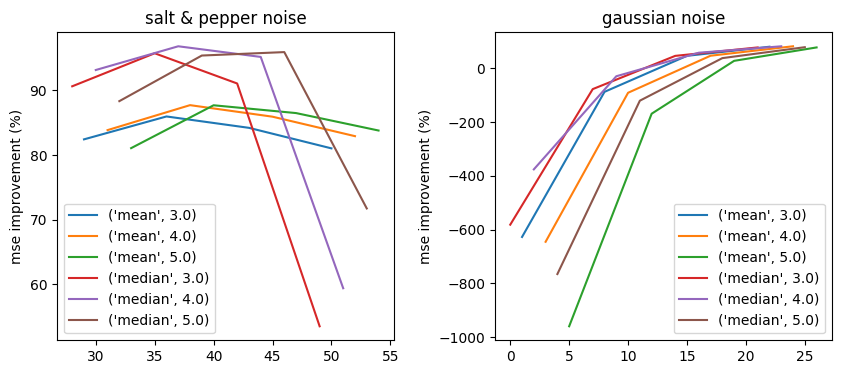

In [39]:
grouped_sp_mse = metrics[(metrics["noise"] == "s&p")].groupby(["filter", "ksize"])[
    "mse_improv_perc"
]
grouped_g_mse = metrics[(metrics["noise"] == "gaussian")].groupby(["filter", "ksize"])[
    "mse_improv_perc"
]

fig, ax = plt.subplots(1, 2, figsize=(10, 4))

for (sp_name, sp_group), (g_name, g_group) in zip(grouped_sp_mse, grouped_g_mse):
    ax[0].plot(sp_group, label=sp_name)
    ax[1].plot(g_group, label=g_name)
ax[0].legend()
ax[0].set_ylabel("mse improvement (%)")
ax[0].set_title("salt & pepper noise")
ax[1].legend()
ax[1].set_ylabel("mse improvement (%)")
ax[1].set_title("gaussian noise")

plt.subplots_adjust(wspace=0.3)
plt.show()

Lo interesante de estos gráficos es ver como los puntos correspondientes al filtro de mediana sobre imágenes con ruido s&p son superiores en el eje y lo cual indica un mejor desempeño en el mejoramiento del mse.
Por el contrario en el gráfico derecho no observamos una diferencia clara.


> Nota: En los dos graficos anteriores el eje x no tiene sentido fisico real, se corresponde a los indices de las filas.


In [41]:
metrics[(metrics.noise == "gaussian")].groupby(["filter", "ksize"]).mean(
    numeric_only=True
)

param       psnr  filtered_psnr         mse  filtered_mse  \
filter ksize                                                              
mean   3.0    18.75  25.233343      24.868725  495.441566    215.341251   
       4.0    18.75  25.233343      24.931371  495.441566    210.664875   
       5.0    18.75  25.233343      23.604915  495.441566    284.328285   
median 3.0    18.75  25.233343      24.860184  495.441566    219.549137   
       4.0    18.75  25.233343      26.093160  495.441566    167.764988   
       5.0    18.75  25.233343      24.250134  495.441566    246.876278   

              psnr_improv_perc  mse_improv_perc  
filter ksize                                     
mean   3.0            5.187975      -146.794671  
       4.0            5.688679      -151.609068  
       5.0            0.298795      -255.584108  
median 3.0            4.767503      -133.500186  
       4.0            9.744703       -66.100637  
       5.0            2.722128      -192.092067

In [42]:
metrics[(metrics.noise == "s&p")].groupby(["filter", "ksize"]).mean(numeric_only=True)

param       psnr  filtered_psnr          mse  filtered_mse  \
filter ksize                                                               
mean   3.0    0.425  10.040154      17.869320  8257.061993   1410.149277   
       4.0    0.425  10.040154      18.346206  8257.061993   1262.293442   
       5.0    0.425  10.040154      18.272312  8257.061993   1228.784119   
median 3.0    0.425  10.040154      19.498341  8257.061993   2127.256672   
       4.0    0.425  10.040154      20.977646  8257.061993   1770.548779   
       5.0    0.425  10.040154      20.568649  8257.061993   1318.107452   

              psnr_improv_perc  mse_improv_perc  
filter ksize                                     
mean   3.0           86.054592        83.409345  
       4.0           91.399482        85.109766  
       5.0           91.693830        84.765028  
median 3.0           94.826591        82.739386  
       4.0          110.633475        86.141641  
       5.0          111.496623        87.853817

In [43]:
def plot_before_after(noise, param, filtro, ksize):
    fig, ax = plt.subplots(1, 2, figsize=(10, 6), sharex=True, sharey=True)

    # imagen y metricas antes de aplicar el filtro
    before_img = noisy_images_df[
        (noisy_images_df["noise"] == noise) & (noisy_images_df["param"] == param)
    ].image.values[0]
    before_mse = mean_squared_error(img_to_be_noised, before_img)
    before_psnr = peak_signal_noise_ratio(img_to_be_noised, before_img)

    # manejo el caso en el que no se le pasa un ksize, ocurre cuando se aplica un filtro nlmeans
    if ksize is None:
        filtro_ksize = filtered_images_df["ksize"].isna().any()
        ksize_text = ""
    else:
        filtro_ksize = filtered_images_df["ksize"] == ksize
        ksize_text = f"con ksize={ksize}"

    # imagen y metricas luego de aplicar el filtro
    after_img = filtered_images_df[
        (filtered_images_df["noise"] == noise)
        & (filtered_images_df["param"] == param)
        & (filtered_images_df["filter"] == filtro)
        & filtro_ksize
    ].image.values[0]
    after_mse = mean_squared_error(img_to_be_noised, after_img)
    after_psnr = peak_signal_noise_ratio(img_to_be_noised, after_img)

    # metricas de mejora
    improve_MSE = (before_mse - after_mse) / before_mse * 100
    improve_PSNR = (after_psnr - before_psnr) / before_psnr * 100

    title = f"Antes y Despues de aplicar filtro {filtro} {ksize_text} sobre imagen con ruido {noise} y sigma={param}"
    title += f"\nMSE mejora = {improve_MSE:.2f}% \n PSNR mejora = {improve_PSNR:.2f}%"
    fig.suptitle(title)

    ax[0].set_title(f"MSE = {before_mse:.2f} PSNR = {before_psnr:.2f}")
    ax[1].set_title(f"MSE = {after_mse:.2f} PSNR = {after_psnr:.2f}")

    ax[0].axis("off")
    ax[1].axis("off")
    ax[0].imshow(before_img)
    ax[1].imshow(after_img)

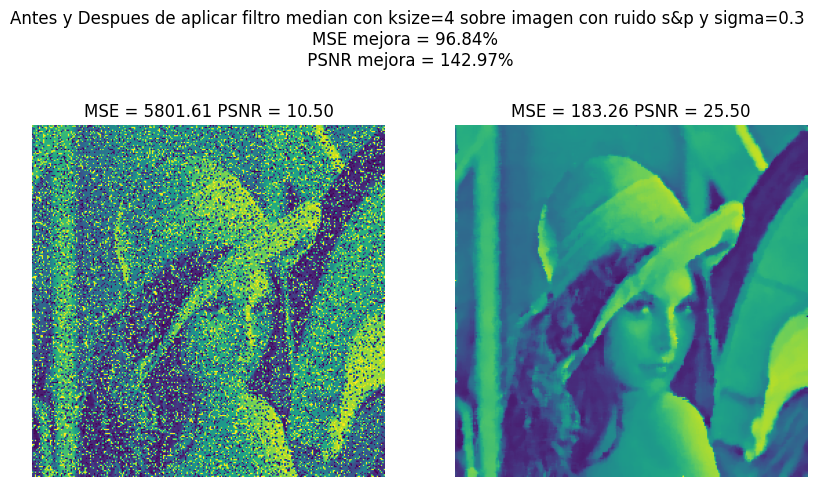

In [46]:
plot_before_after("s&p", 0.3, "median", 4)

En este ejemplo, la mejora es destacable


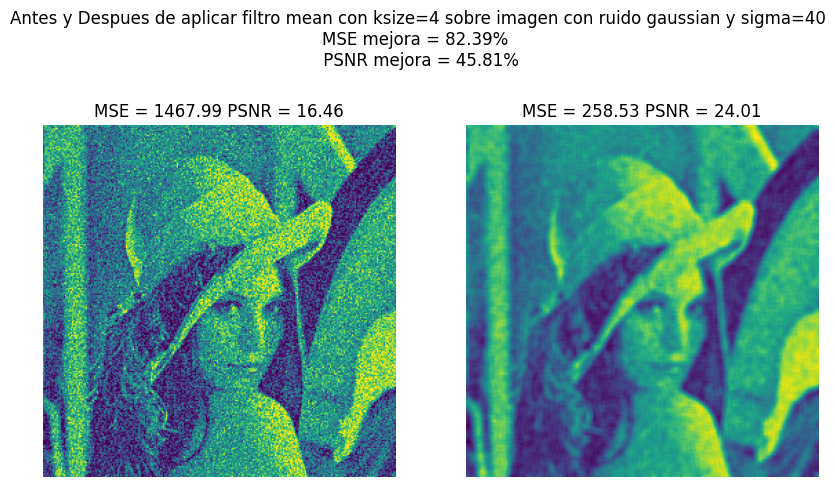

In [47]:
plot_before_after("gaussian", 40, "mean", 4)

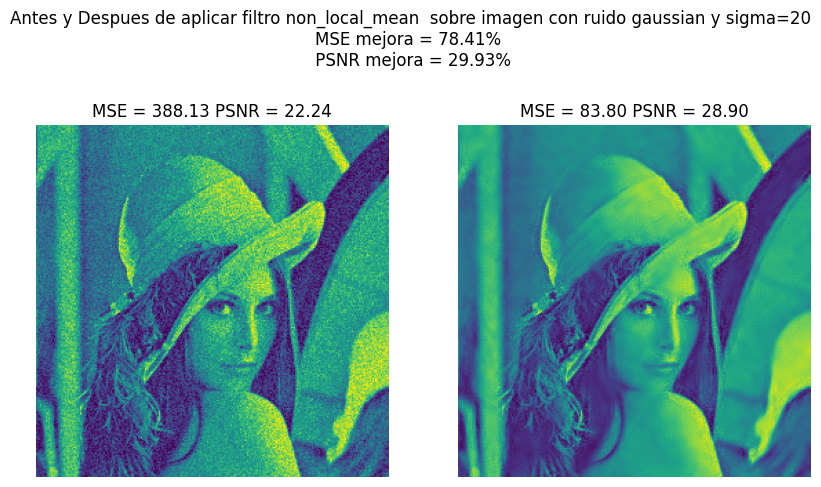

In [52]:
plot_before_after("gaussian", 20, "non_local_mean", None)

Aquí también se aprecia una muy buena mejora


Algunas fuentes consultadas

https://es.wikipedia.org/wiki/Ruido_sal_y_pimienta

https://stackoverflow.com/questions/71805460/improving-a-median-filter-to-process-images-with-heavy-impulse-saltpepper-noise


## 4) Movimiento lineal uniforme


**a) Ver PSF y MTF del movimiento lineal uniforme (se provee una función que calcula la PSF a partir del largo y el ángulo del movimiento)**

Para un cierto movimiento lineal, mostrar PSF y MTF. Analizar qué forma tiene la MTF.

Aplicar el movimiento sobre una imagen y mostrar las imágenes original y degradada y sus transformadas.


In [6]:
from skimage import transform
from scipy import fftpack
from scipy.signal import convolve2d

In [5]:
def motionPSF(largo=9, angulo_en_grados=0, sz=65):
    # Se genera una imagen cuadrada de lado sz y se pinta una linea horizontal
    # en el medio de la imagen de tamaño igual al largo
    f = np.zeros((sz, sz))
    f[
        sz // 2, sz // 2 - largo // 2 : sz // 2 + largo // 2 + 1
    ] = 1  # "//" hace una división entera
    # Luego se rota el angulo especificado
    f = transform.rotate(f, angulo_en_grados)
    # Finalmente se normaliza
    f = f / np.sum(f)
    return f

In [4]:
def mtf(x):
    mtf = np.abs(fftpack.fftshift(fftpack.fft2(x)))
    # normalizar no es completamente necesario, pero es conveniente para visualizar y hacer comparaciones
    norm = mtf / np.max(mtf)
    return norm

In [6]:
def plot_psf_mtf(psf):
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(psf, cmap="gray")
    axes[0].set_title("PSF")
    axes[1].imshow(mtf(psf), cmap="gray")
    axes[1].set_title("MTF")
    plt.show()

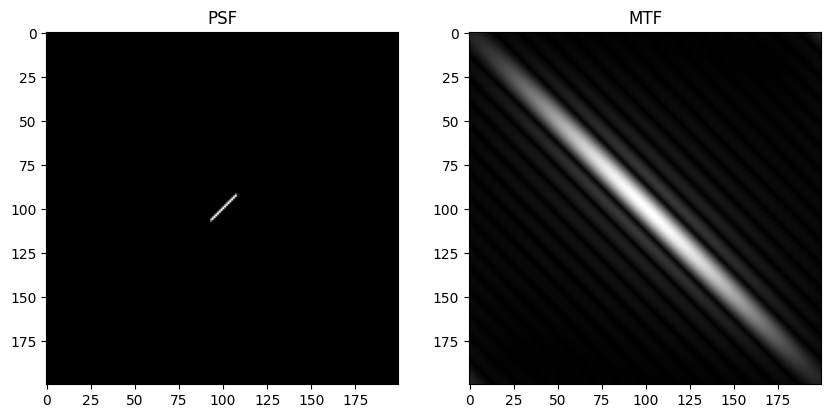

In [28]:
plot_psf_mtf(motionPSF(20, 45, 200))

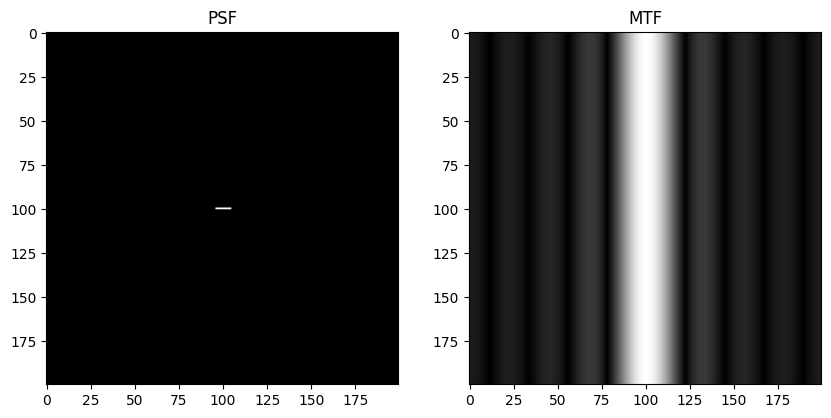

In [29]:
plot_psf_mtf(motionPSF(9, 0, 200))

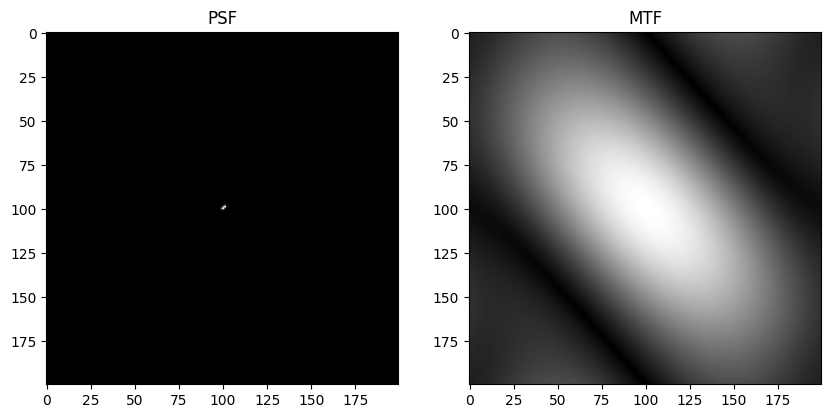

In [34]:
plot_psf_mtf(motionPSF(2, 45, 200))

La MTF adopta una forma particular donde se puede ver un patrón repetitivo de **líneas perpendiculares al ángulo de la PSF**, además se puede observar como el color es más intenso en el centro y rápidamente se va difuminando a medida que se aleja de éste.

También se puede ver como el **grosor de las líneas del patrón sigue una "relación inversa" con el largo de la PSF**, cuanto más pequeño el largo del movimiento más gruesas las líneas.


In [4]:
from matplotlib.colors import LogNorm

In [38]:
lena = imread(os.path.join(dir_base_imagenes, "lena.bmp"), as_gray=True)

In [19]:
img_to_move = lena
params = [(0, 0), (9, 45), (9, 15), (9, 60), (3, 45), (20, 45)]

move_img = lambda largo, angulo: convolve2d(
    img_to_move, motionPSF(largo, angulo), mode="same", boundary="symm"
)
degraded_imgs = [move_img(length, angle) for length, angle in params]

degraded_imgs_mtfs = [mtf(img) for img in degraded_imgs]
mtf_original = mtf(img_to_move)

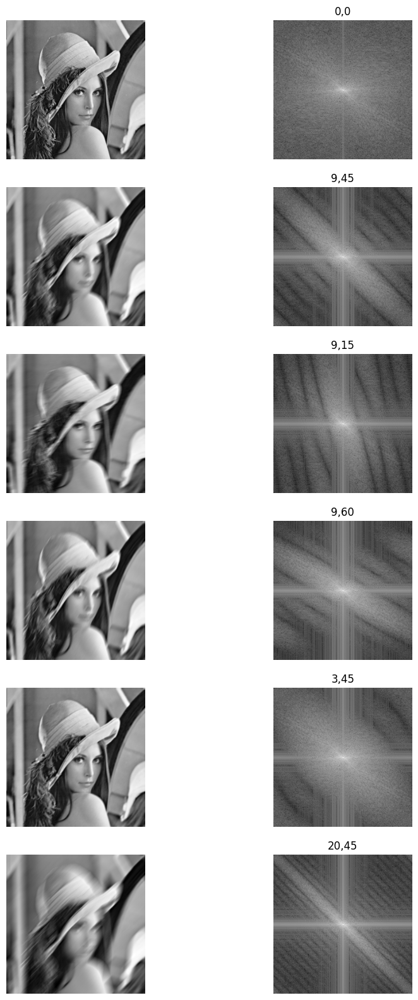

In [59]:
fig, axes = plt.subplots(6, 2, figsize=(10, 20))

for idx, img_deg, mtf_deg, (length, angle) in zip(
    range(6), degraded_imgs, degraded_imgs_mtfs, params
):
    axes[idx, 0].set_axis_off()
    axes[idx, 1].set_axis_off()
    axes[idx, 0].imshow(img_deg, cmap="gray")
    axes[idx, 1].set_title(f"{length},{angle}")
    axes[idx, 1].imshow(
        mtf_deg, cmap="gray", norm=LogNorm(vmin=mtf_deg.min(), vmax=mtf_deg.max())
    )

plt.show()

**b) Se busca hacer visible el número de matrícula en las imágenes blurred1.png, blurred2.png, blurred3.png.  
Intente restaurar las imágenes utilizando las siguientes técnicas:**

-   Filtrado inverso (implementar)
-   Filtrado pseudo inverso (implementar)
-   Filtrado de Wiener (usar la función “wiener” del paquete skimage.restoration con diversos parámetros)


In [61]:
def padding_constant_0(psf, I):
    a = int(psf.shape[0] // 2)
    b = int(psf.shape[1] // 2)
    psf = np.pad(
        psf,
        (
            (I.shape[0] - psf.shape[0] + a, I.shape[0] - a),
            (I.shape[1] - psf.shape[1] + b, I.shape[1] - b),
        ),
        "constant",
    )
    return psf


def inverse_filter(I, psf):
    # centrado de la psf sobre la imagen
    psf = padding_constant_0(psf, I)

    # transformada de la psf
    H = np.fft.fft2(psf, s=I.shape)
    # transformada de la imagen degradada
    G = np.fft.fft2(I)

    # filtro inverso, problematico con Hij ~ 0
    H_i = np.divide(1, H)

    # aplicar filtro inverso a la imagen degradada
    F = np.multiply(H_i, G)

    restored = np.real(np.fft.ifft2(F))

    return restored


def pseudo_inverse_filter(I, psf, eps):
    # centrado de la psf sobre la imagen
    psf = padding_constant_0(psf, I)

    # transformada de la psf
    H = np.fft.fft2(psf, s=I.shape)
    # transformada de la imagen degradada
    G = np.fft.fft2(I)

    # filtro pseudo inverso, proceso regularizacion (+eps) para evitar division por cero
    H_i = np.divide(1, H + eps)

    # aplicar filtro a la imagen degradada
    F = np.multiply(H_i, G)
    restored = np.real(np.fft.ifft2(F))

    return restored

In [4]:
from skimage import restoration

In [3]:
blurred1 = imread(f"{dir_zip_imagenes}blurred1.png", as_gray=True)
blurred2 = imread(f"{dir_zip_imagenes}blurred2.png", as_gray=True)
blurred3 = imread(f"{dir_zip_imagenes}blurred3.png", as_gray=True)

Como ya se vió en la parte **a)** la anchura e inclinación de la línea central en la MTF pueden proporcionar información sobre la magnitud y dirección del movimiento lineal en la imagen original.
Por eso se procederá a realizar mediciones de esto con Fiji para estimar los parámetros.


Para el ángulo las estimaciones fueron razonablmente buenas, respecto al largo fue mayormente a ensayo y error.


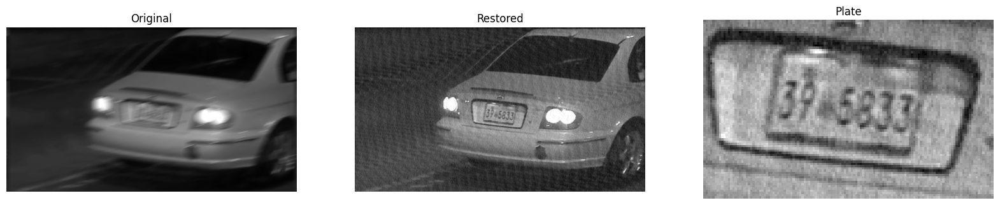

In [119]:
fig, ax = plt.subplots(1, 3, figsize=(20, 5))
_ = [a.set_axis_off() for a in ax.flat]
ax[0].set_title("Original")
ax[0].imshow(blurred1, cmap="gray")
ax[1].set_title("Restored")
restored = restoration.wiener(blurred1, motionPSF(20, 15), balance=0.00001)
ax[1].imshow(restored, cmap="gray")
ax[2].set_title("Plate")
ax[2].imshow(restored[150:230, 250:380], cmap="gray")
plt.show()

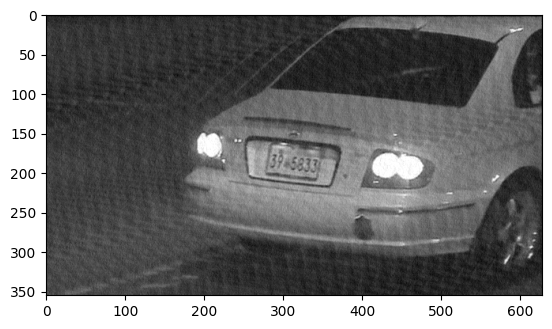

In [120]:
plt.imshow(
    restoration.wiener(blurred1, motionPSF(21, 15), balance=0.00001), cmap="gray"
)

Las medidas estimadas con el software Fiji fueron largo de 100 y ángulo de 15.

Posteriormente se ensayó con varios valores y consideró como la mejor solución a los parámetros largo de 20 o 21 y ángulo de 15.

Blurred1 matricula 39-5833.


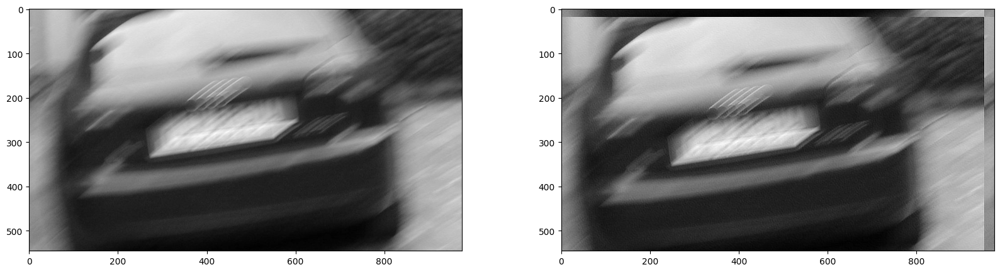

In [9]:
fig, ax = plt.subplots(1, 2, figsize=(20, 5))
vmin, vmax = np.min(blurred2), np.max(blurred2)
ax[0].imshow(blurred2, cmap="gray", vmin=vmin, vmax=vmax)
ax[1].imshow(
    restoration.wiener(blurred2, motionPSF(73, 37), balance=0.01, clip=False),
    cmap="gray",
    vmin=vmin,
    vmax=vmax,
)

Se estimó un ángulo de 36 o 37.

Sin embargo no se pudo encontrar un par de parámetros que ofrecieran resultados suficientemente buenos.

Se distingue algo como 252823V1 pero no esta nada claro


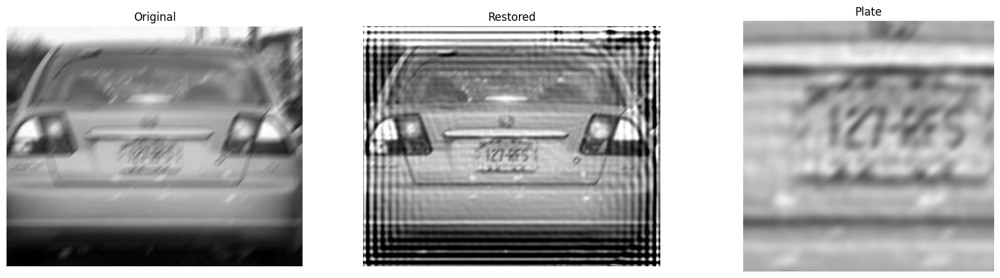

In [44]:
fig, ax = plt.subplots(1, 3, figsize=(20, 5))
_ = [a.set_axis_off() for a in ax.flat]
vmin, vmax = np.min(blurred3), np.max(blurred3)
ax[0].set_title("Original")
ax[0].imshow(blurred3, cmap="gray", vmin=vmin, vmax=vmax)
ax[1].set_title("Restored")
restored = restoration.wiener(blurred3, motionPSF(26, 45), balance=0.5)
ax[1].imshow(restored, cmap="gray", vmin=vmin, vmax=vmax)
ax[2].set_title("Plate")
ax[2].imshow(restored[250:450, 250:450], cmap="gray", vmin=vmin, vmax=vmax)
plt.show()

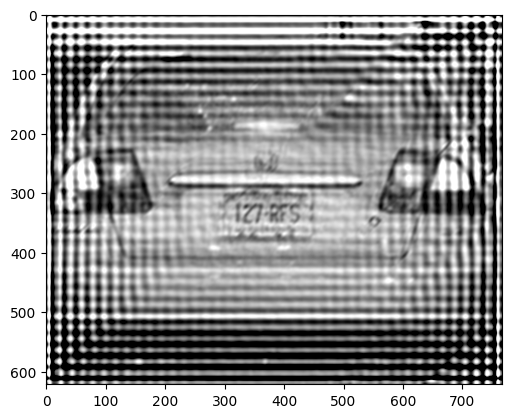

In [268]:
plt.imshow(
    restoration.wiener(blurred3, motionPSF(27, 45), balance=0.1),
    cmap="gray",
    vmin=vmin,
    vmax=vmax,
)

Se estimó un largo de 69 y un ángulo de 46.

Finalmente se consideró la mejor solución a la combinación largo 26 o 27 y ángulo 45.

Para Blurred3 la matricula es 127-RFS.


https://www.clear.rice.edu/elec431/projects95/lords/wolf.html


In [54]:
def compare_filters(img, psf, eps, improve_contrast=False):
    undegraded = [
        inverse_filter(img, psf),
        pseudo_inverse_filter(img, psf, eps),
        restoration.wiener(img, psf, balance=eps, clip=False),
    ]
    filter_names = ["Inverse", "Pseudo Inverse", "Wiener"]

    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    for a, undeg_img, name in zip(ax.flat, undegraded, filter_names):
        a.set_axis_off()
        a.imshow(undeg_img, cmap="gray")
        a.set_title(f"Filter {name}")
    plt.show()

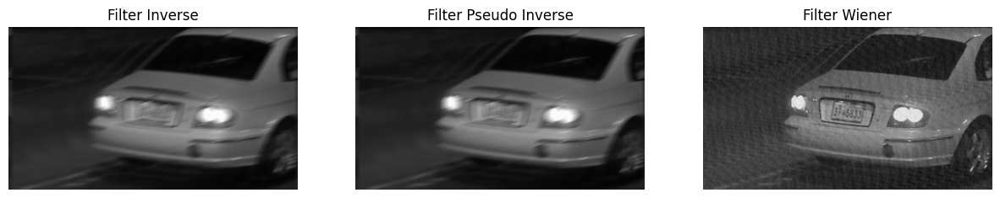

In [51]:
compare_filters(blurred1, motionPSF(21, 15), eps=0.00001)

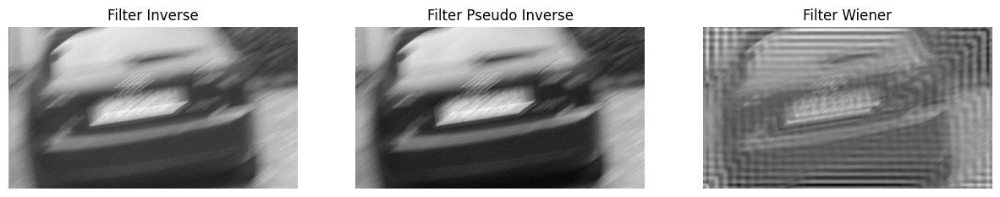

In [52]:
compare_filters(blurred2, motionPSF(38, 39), eps=1)

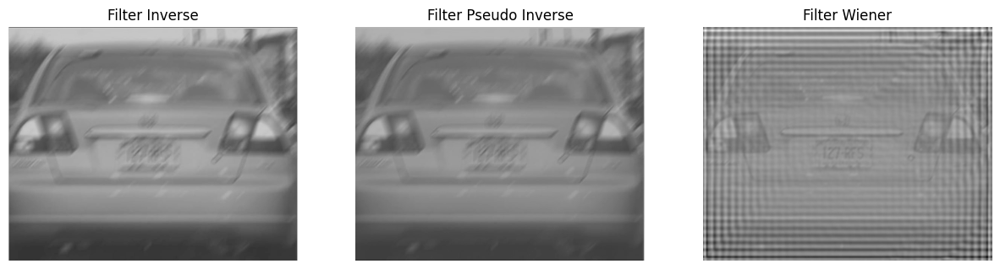

In [53]:
compare_filters(blurred3, motionPSF(27, 45), eps=0.1)

## 5) Transformada DFT

### Visualización en espacio y frecuencia


**a)** Visualizar la imagen trapo.jpg y graficar varios perfiles (horizontal y vertical) del trapo de la imagen.  
Medir el _periodo de la onda en cada dirección_. No es necesaria una medida exhaustiva. Puede ser conveniente usar Fiji para esta tarea.


**b)** Calcular la transformada de Fourier de la imagen y visualizar los picos espectrales. Indicar en qué frecuencias ocurren estos picos.


**c)** Discutir la relación entre las medidas realizadas en el espacio en **(a)** y la ubicación de los picos en frecuencia en **(b)**


In [3]:
trapo = imread(os.path.join(dir_base_imagenes, "trapo.jpg"))

In [131]:
def plot_profile(image, row, col, row_extremes=None, col_extremes=None):
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))

    # si no se especifican los extremos, se toman los extremos de la imagen
    rs, re = (0, image.shape[0]) if row_extremes is None else row_extremes
    cs, ce = (0, image.shape[1]) if col_extremes is None else col_extremes

    ax[0].imshow(image, cmap="gray")
    # grafico de las lineas de perfil sobre la imagen
    ax[0].plot(range(rs, re), [row] * (re - rs), "r--")
    ax[0].plot([col] * (ce - cs), range(cs, ce), "b--")

    # graficos de los perfiles
    ax[1].plot(range(rs, re), image[row, rs:re], "r")
    ax[2].plot(range(cs, ce), image[cs:ce, col], "b")

    plt.show()

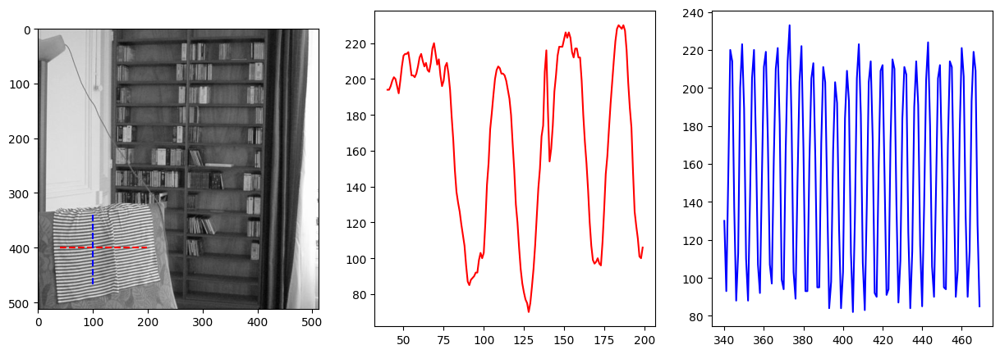

In [132]:
plot_profile(trapo, 400, 100, row_extremes=(40, 200), col_extremes=(340, 470))

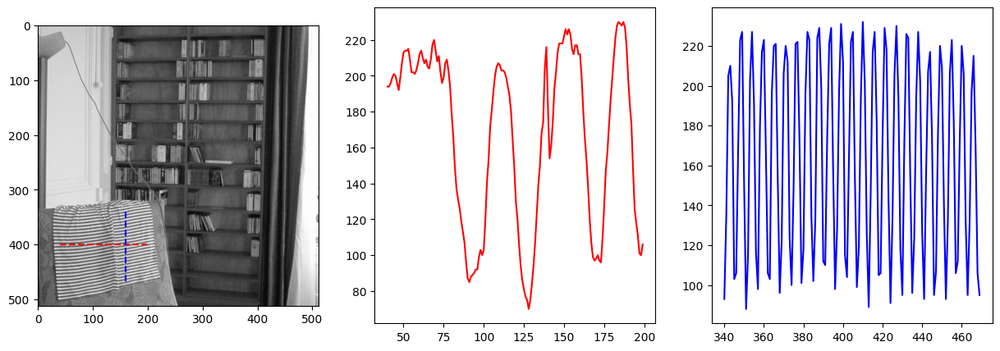

In [134]:
plot_profile(trapo, 400, 160, row_extremes=(40, 200), col_extremes=(340, 470))

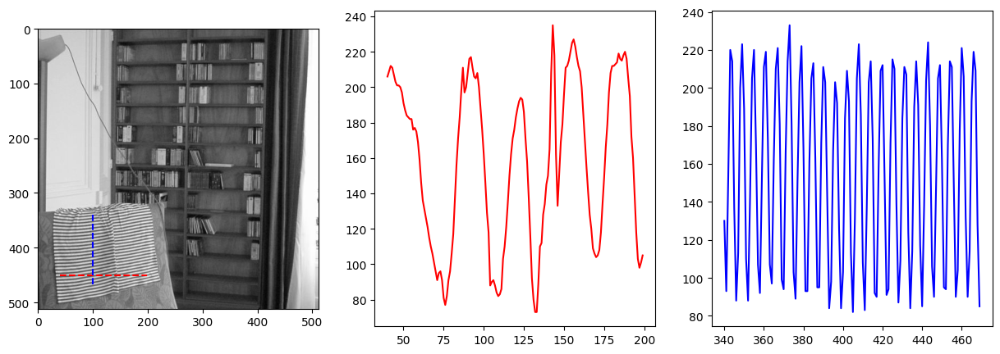

In [135]:
plot_profile(trapo, 450, 100, row_extremes=(40, 200), col_extremes=(340, 470))

En el eje y el periodo de onda medido fue de 5.8-6.3 pixeles aprox.
En el eje x de 29.4-35.1 pixeles

(Las medidas fueron tomadas con con Fiji)


In [2]:
def amplitude_spectrum(image):
    # Realizar la transformada de Fourier 2D de la imagen
    fft2d = np.fft.fft2(image)
    # Aplicar un desplazamiento (shift) al espectro para centrar el origen
    fft2d_shifted = np.fft.fftshift(fft2d)
    # Calcular el valor absoluto del espectro, esto es la amplitud o magnitud del espectro
    amplitud_espectro = np.abs(fft2d_shifted)
    # Aplicar una transformación logarítmica a la amplitud del espectro, referencia del video abajo
    amplitud_espectro_log = np.log10(amplitud_espectro + 1)
    return amplitud_espectro_log

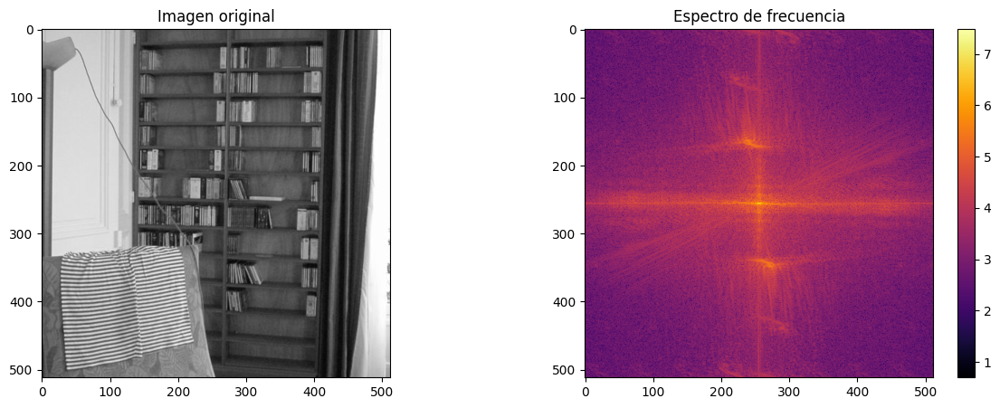

In [152]:
# Visualizar la imagen original y el espectro de frecuencia
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].imshow(trapo, cmap="gray")
ax[0].set_title("Imagen original")
im = ax[1].imshow(amplitude_spectrum(trapo), cmap="inferno")
ax[1].set_title("Espectro de frecuencia")
fig.colorbar(im, cmap="inferno", ax=ax[1])
plt.show()

https://www.youtube.com/watch?v=PagWL_o4Ymk
min 33. (escala logaritmica)


El gráfico de la Transformada de Fourier nos permite ver la distribución de frecuencias presentes en la imagen, entonces los picos espectrales en el gráfico de la FFT representarán las frecuencias dominantes en la imagen.

En general, los picos espectrales en el gráfico de la FFT de una imagen suelen corresponder a características prominentes de la imagen, como bordes, texturas, patrones repetitivos u otros elementos estructurales.
Estos picos aparecen como puntos altos en el gráfico de amplitud de la FFT, que representa la magnitud de las diferentes frecuencias presentes en la imagen.

La ubicación de los picos espectrales en el gráfico de la FFT está relacionada con la frecuencia de la señal en la imagen. La frecuencia se mide en ciclos por unidad de distancia (por ejemplo, ciclos por píxel). Los picos espectrales en la dirección horizontal del gráfico de la FFT representan las frecuencias en la dirección horizontal de la imagen, mientras que los picos espectrales en la dirección vertical del gráfico de la FFT representan las frecuencias en la dirección vertical de la imagen.


Como la frecuencia tiene una relación inversa al periodo.


In [45]:
# En el eje y el periodo de onda medido fue de 5.8-6.3 pixeles aprox.
print(f"{1/5.8:.3f} > f > {1/6.3:.3f} ciclos por pixel en la direccion vertical")
# En el eje x de 29.4-35.1 pixeles
print(f"{1/29.4:.3f} > f > {1/35.1:.3f} ciclos por pixel en la direccion horizontal")

0.172 > f > 0.159 ciclos por pixel en la direccion vertical
0.034 > f > 0.028 ciclos por pixel en la direccion horizontal


Como la imagen es de 512x512 píxeles


In [117]:
0.17 * 512

87.04

In [116]:
0.029 * 512

14.848

Significa que hay una frecuencia dominante en la dirección horizontal a aproximadamente 15 ciclos por 512 píxeles, y en la dirección vertical a aproximadamente 87 ciclos por 512 píxeles.

Para graficarla sobre el gráfico de la FFT, le restamos las coordenadas del centro del gráfico de la FFT (para coincidir con el shifteo que hacemos al resultado de la FFT)


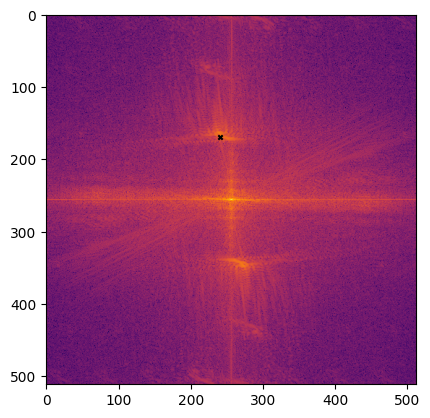

In [157]:
plt.imshow(amplitude_spectrum(trapo), cmap="inferno")
# shifteo al centro
coord_x, coord_y = np.abs(15 - 256), np.abs(87 - 256)
plt.scatter(coord_x, coord_y, c="black", s=10, marker="x")

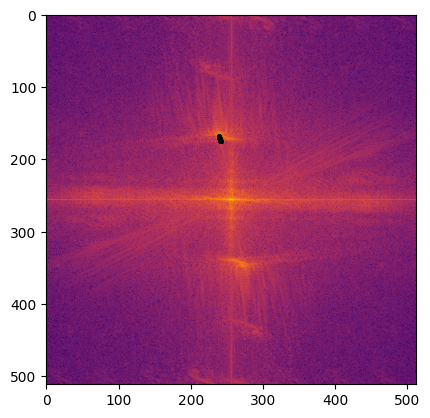

In [159]:
img = trapo
# En el eje y el periodo de onda medido fue de 5.8-6.3 pixeles aprox.
ys = np.abs(np.linspace(1 / 5.8, 1 / 6.3, 100) * img.shape[1] - img.shape[1] // 2)
# En el eje x de 29.4-35.1 pixeles
xs = np.abs(np.linspace(1 / 29.4, 1 / 35.1, 100) * img.shape[0] - img.shape[0] // 2)

plt.imshow(amplitude_spectrum(img), cmap="inferno")
plt.scatter(xs, ys, c="black", s=5)

Otra forma que se me ocurrió para corroborar que estos picos espectrales corresponden a los valores de frecuencia que aporta el trapo fue la de aplicar un filtro blur sobre el trapo usando una herramienta gráfica para suavizar el patrón.


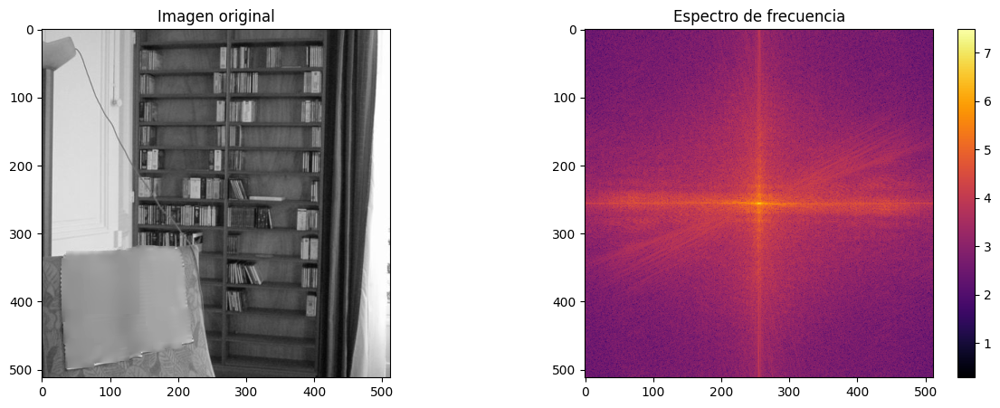

In [151]:
import cv2

trapo2 = cv2.imread(os.path.join(dir_zip_imagenes, "trapo2.png"), cv2.IMREAD_GRAYSCALE)

# Visualizar la imagen original y el espectro de frecuencia
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].imshow(trapo2, cmap="gray")
ax[0].set_title("Imagen original")
im = ax[1].imshow(amplitude_spectrum(trapo2), cmap="inferno")
ax[1].set_title("Espectro de frecuencia")
fig.colorbar(im, cmap="inferno", ax=ax[1])
plt.show()

# se aplico un filtro de blur sobre el trapo usando https://community.linuxmint.com/software/view/drawing

Vemos que ahora esos picos desaparecieron del espectro.


> Nota: El de abajo también por la simetría del espectro


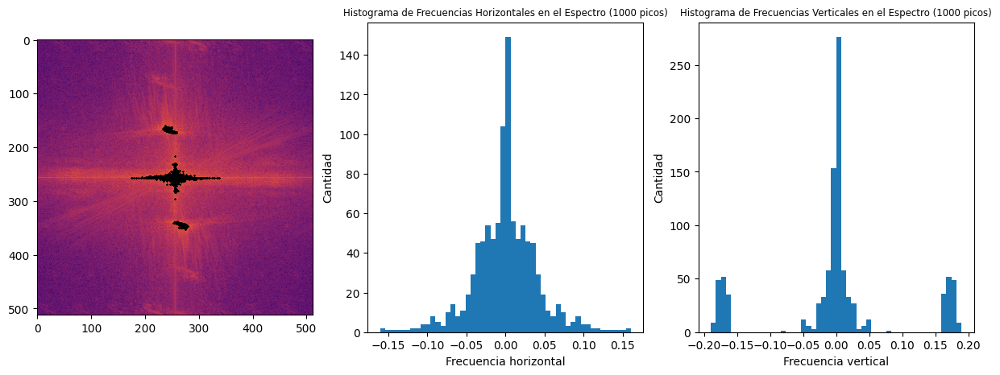

In [67]:
espectro_log = amplitude_spectrum(trapo)
N = 1000
# Encontrar los índices de los picos espectrales
coordenadas_picos = np.unravel_index(
    np.argsort(espectro_log.flat)[-N:], espectro_log.shape
)
# Obtener las frecuencias correspondientes a los picos espectrales
frecuencia_horizontal = (coordenadas_picos[1] - espectro_log.shape[1] // 2) * (
    1 / espectro_log.shape[1]
)
frecuencia_vertical = (coordenadas_picos[0] - espectro_log.shape[0] // 2) * (
    1 / espectro_log.shape[0]
)

fig, ax = plt.subplots(1, 3, figsize=(15, 5))

ax[0].imshow(espectro_log, cmap="inferno")
ax[0].scatter(coordenadas_picos[1], coordenadas_picos[0], c="black", s=1, marker="x")

# Crear un histograma de las frecuencias horizontales
ax[1].hist(frecuencia_horizontal, bins=50)
ax[1].set_xlabel("Frecuencia horizontal")
ax[1].set_ylabel("Cantidad")
ax[1].set_title(
    f"Histograma de Frecuencias Horizontales en el Espectro ({N} picos)", fontsize=8.5
)

# Crear un histograma de las frecuencias verticales
ax[2].hist(frecuencia_vertical, bins=50)
ax[2].set_xlabel("Frecuencia vertical")
ax[2].set_ylabel("Cantidad")
ax[2].set_title(
    f"Histograma de Frecuencias Verticales en el Espectro ({N} picos)", fontsize=8.5
)
ax[2].set_xticks(np.arange(-0.2, 0.21, 0.05))

plt.show()

## 6) Template matching


**a)** Diseñar un programa que detecte automáticamente cuántas veces aparece Wally en la imagen “dondeEstaWally.png”. Se deberá implementar la comparación de al menos tres maneras diferentes:

-   correlación espacial
-   correlación usando la FFT
-   correlación de fase ([phase correlation](https://en.wikipedia.org/wiki/Phase_correlation))

Para esa tarea se podrá usar la función **scipy.signal.convolve**. En caso de usar esta función o una similar, se explicarán los parámetros usados.


**b)** Comparar los resultados y los tiempos insumidos por los distintos métodos


In [8]:
wally = imread(os.path.join(dir_zip_imagenes, "Wally_template.png"))
donde_esta_wally = imread(os.path.join(dir_zip_imagenes, "dondeEstaWally.png"))

# estandarizar permite ajustar el brillo y el contraste en las imágenes.
# asegurarnos que las imágenes tengan escalas de intensidad similares permite eliminar cualquier diferencia potencial en el brillo o el contraste entre las imágenes que puedan afectar los resultados de la correlación.
standarize = lambda x: (x - np.mean(x)) / np.std(x)

wally_std = standarize(wally)
donde_esta_wally_std = standarize(donde_esta_wally)

In [25]:
from scipy.signal import correlate2d, convolve2d
from scipy.signal import fftconvolve
from matplotlib.collections import PatchCollection

In [15]:
def spatial_correlation(image, template):
    ## OPCION 1
    # corr_map = correlate2d(image, template, mode='same')

    ## OPCION 2
    # Giro horizontal y vertical de la imagen (180),  equivalente a template[::-1,::-1]
    template_flipped = np.fliplr(np.flipud(template))
    # Calcula la convolucion entre la imagen y la plantilla, 'same' para que la salida tenga el mismo tamaño que la imagen original
    conv_map = convolve2d(image, template_flipped, mode="same")
    return conv_map


def using_fft_correlation(image, template):
    template_flipped = np.fliplr(np.flipud(template))
    # Calculo de la correlación mediante la FFT
    corr = fftconvolve(image, template_flipped, mode="same")
    return corr


def phase_correlation(image, template):
    # Calculo de las Transformadas de Fourier
    f = np.fft.fft2(image)
    g = np.fft.fft2(template, s=image.shape)

    # Calcular la correlación de fase
    R = f * np.conj(g)
    R /= np.abs(R) + 1e-8
    r = np.real(np.fft.ifft2(R))
    return r


def template_matching(image, template, correlation_func, threshold, show=True):
    corr_map = correlation_func(image, template)
    # Normalizar la matriz de correlación
    corr_map = corr_map / np.max(corr_map)
    # Encontrar las posiciones donde la correlación es mayor que el umbral
    ys, xs = np.where(corr_map >= threshold)

    if show:
        # Dibujar los rectángulos en la imagen original
        fig, ax = plt.subplots(figsize=(12, 6))
        ax.imshow(image, cmap="gray")
        h, w = template.shape

        # phase correlation ya devuelve las cordenadas del vértice superior izquierdo
        if correlation_func == phase_correlation:
            top_left_corner_coord = lambda x, y: (x, y)
        # spatial correlation y using_fft_correlation devuelven las coordenadas del centro del rectángulo
        else:
            top_left_corner_coord = lambda x, y: (x - w // 2, y - h // 2)

        rectangles = [
            plt.Rectangle(top_left_corner_coord(x, y), w, h) for x, y in zip(xs, ys)
        ]
        ax.add_collection(
            PatchCollection(rectangles, edgecolor="r", facecolor="none", linewidth=2)
        )

        ax.axis("off")
        plt.show()

    # devuelve la cantidad de coincidencias encontradas
    return len(xs), ys, xs

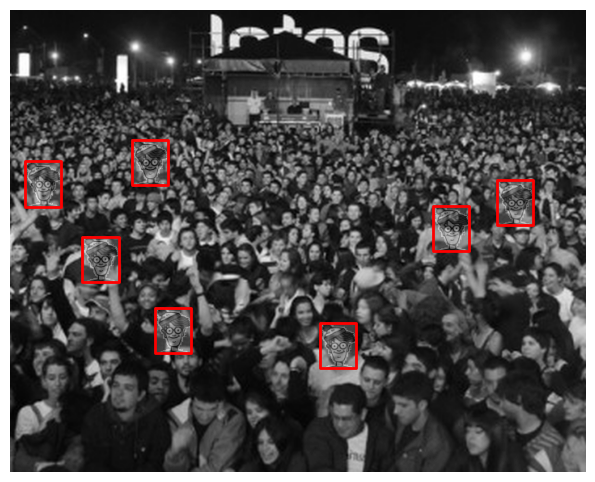

In [16]:
_ = template_matching(donde_esta_wally_std, wally_std, spatial_correlation, 0.7)

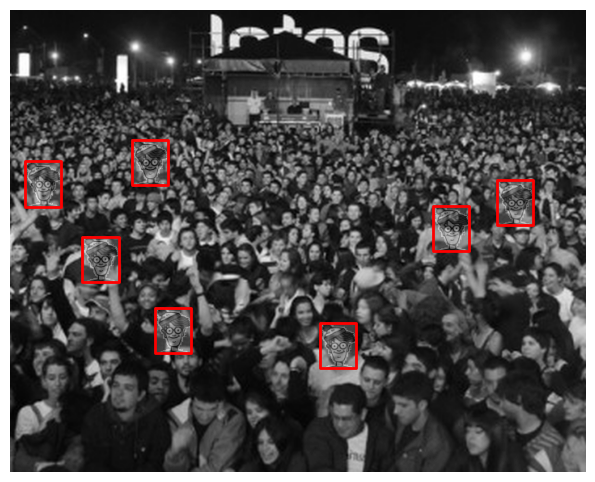

In [144]:
_ = template_matching(donde_esta_wally_std, wally_std, using_fft_correlation, 0.7)

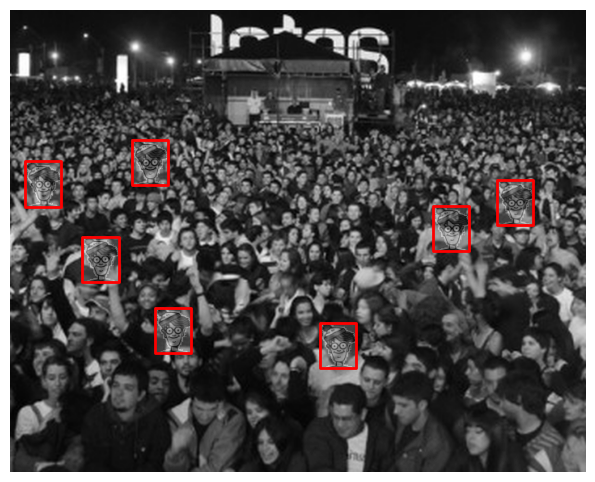

In [145]:
_ = template_matching(donde_esta_wally_std, wally_std, phase_correlation, 0.7)

In [126]:
%timeit spatial_correlation(donde_esta_wally_std, wally_std)

3.49 s ± 692 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [127]:
%timeit using_fft_correlation(donde_esta_wally_std, wally_std)

26.9 ms ± 9.5 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [128]:
%timeit phase_correlation(donde_esta_wally_std, wally_std)

78.4 ms ± 19.7 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


En términos de tiempo insumido por los distintos métodos, podemos indicar que la estrategia que obtiene la correlación usando la transformada de fourier es la más eficiente, luego el método de correlación de fase y por último (y gran diferencia) el método de correlacion espacial.

La diferencia es grande puesto que estamos hablando de dos órdenes de magnitud.


In [132]:
3.49 / (26.9 / 1000)

129.73977695167287

In [133]:
3.49 / (78.4 / 1000)

44.515306122448976

En particular la spatial_correlation es aprox. 130 veces más lento que using_fft_correlation y 45 veces más lento que phase_correlation.


In [ ]:
import pandas as pd

In [149]:
thresholds = np.linspace(0.1, 0.9, 9)
# Crear una lista para almacenar los resultados
results_list = []
for threshold in thresholds:
    spatial, _, _ = template_matching(
        donde_esta_wally_std, wally_std, spatial_correlation, threshold, show=False
    )
    fft, _, _ = template_matching(
        donde_esta_wally_std, wally_std, using_fft_correlation, threshold, show=False
    )
    phase, _, _ = template_matching(
        donde_esta_wally_std, wally_std, phase_correlation, threshold, show=False
    )
    # Agregar los resultados a la lista
    results_list.append(
        {"threshold": threshold, "spatial": spatial, "fft": fft, "phase": phase}
    )
# Convertir la lista en un DataFrame de Pandas
results = pd.DataFrame(results_list)

In [150]:
results

,threshold,spatial,fft,phase
0,0.1,81867,81867,7
1,0.2,20986,20986,7
2,0.3,4508,4508,7
3,0.4,759,759,7
4,0.5,22,22,7
5,0.6,10,10,7
6,0.7,7,7,7
7,0.8,6,6,7
8,0.9,3,3,7


Por otro lado, vemos como tanto spatial_correlation y use_fft_correlation son muy sensibles al parámetro threshold. Muy distinto es el caso de phase_correlation el cual consigue encontrar las 7 coincidencias incluso para valores de threshold bajos


In [184]:
res = phase_correlation(donde_esta_wally_std, wally_std)
res /= np.max(res)

# Número de valores que deseas sean mayores a N
num_valores_mayores = 8

# Encontrar el valor de N
N = np.partition(res.flat, -num_valores_mayores)[-num_valores_mayores]

print("Valor de N:", N)

Valor de N: 0.03520156526725192


Tendríamos que determinar un valor de threshold <= 0.035 para que phase_correlation detecte un falso positivo.


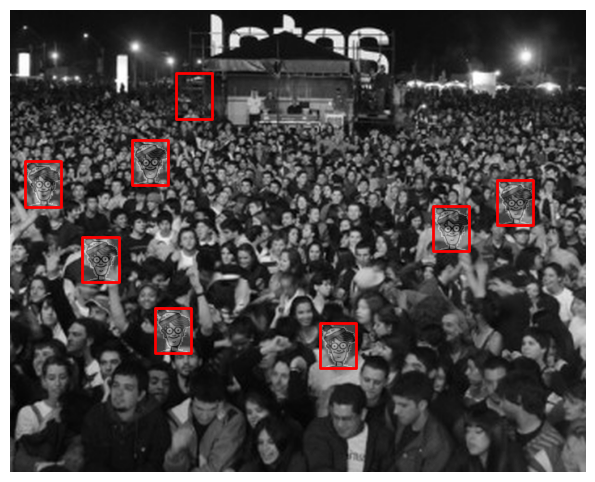

In [186]:
_ = template_matching(donde_esta_wally_std, wally_std, phase_correlation, 0.035)